# Unsupervised learning capstone

For your third capstone, you’ll complete an unsupervised learning project. You can choose your own research question or choose from one below.

Go out and find a dataset of interest. It could be one that helps you work on one of our recommended research questions, or any other dataset that addresses an unsupervised learning question of your own.

Explore the data. Get to know the data. Spend a lot of time going over its quirks and peccadilloes. You should understand how it was gathered, what's in it, and what the variables look like.

You should try several different approaches and really work to tune a variety of models before choosing what you consider to be the best performer.

Things to keep in mind: how do clustering and modeling compare? What are the advantages of each? Why would you want to use one over the other?

Be prepared to talk about:

- Your end-user and the value your project provides to them.
- Quantifiable results based on the research you’ve conducted.
- The visuals you chose and what they represent for your research.
- Next steps you'd take to expand on your work.
- A specified research question your model addresses.
- How you chose your model specification and what alternatives you compared it to.
- The practical uses of your model for an audience of interest.
- Any weak points or shortcomings of your model.

[Animal Outbreaks](https://www.kaggle.com/tentotheminus9/empres-global-animal-disease-surveillance)

In [3]:
import os
os.chdir('/Users/sophiaperides/Desktop/Thinkful')
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.datasets import fetch_openml
%matplotlib inline
from datetime import datetime, timedelta
import re


from matplotlib import image
from sklearn.preprocessing import StandardScaler
from scipy.stats.mstats import winsorize
from sklearn.preprocessing import normalize
import scipy.stats as stats
from sklearn.neural_network import MLPClassifier
from sklearn import ensemble
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV


from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn import datasets, metrics
from sklearn.cluster import MiniBatchKMeans

In [4]:
outbreaks = pd.read_csv('animal_outbreaks.csv')
outbreaks = pd.DataFrame(outbreaks)
print(outbreaks.columns)
print(outbreaks.info())

Index(['Id', 'source', 'latitude', 'longitude', 'region', 'country', 'admin1',
       'localityName', 'localityQuality', 'observationDate', 'reportingDate',
       'status', 'disease', 'serotypes', 'speciesDescription', 'sumAtRisk',
       'sumCases', 'sumDeaths', 'sumDestroyed', 'sumSlaughtered',
       'humansGenderDesc', 'humansAge', 'humansAffected', 'humansDeaths'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17008 entries, 0 to 17007
Data columns (total 24 columns):
Id                    17008 non-null int64
source                17008 non-null object
latitude              17008 non-null float64
longitude             17008 non-null float64
region                17008 non-null object
country               17008 non-null object
admin1                17008 non-null object
localityName          17008 non-null object
localityQuality       17008 non-null object
observationDate       16506 non-null object
reportingDate         17008 non-null object
status    

In [5]:
outbreaks.serotypes.fillna('Uknown', inplace=True)
outbreaks.speciesDescription.fillna('Uknown', inplace=True)
outbreaks.sumAtRisk.fillna(outbreaks.sumAtRisk.mean(), inplace=True)
outbreaks.sumCases.fillna(outbreaks.sumCases.mean(), inplace=True)
outbreaks.sumDeaths.fillna(outbreaks.sumDeaths.mean(), inplace=True)
outbreaks.sumDestroyed.fillna(outbreaks.sumDestroyed.mean(), inplace=True)
outbreaks.sumSlaughtered.fillna(outbreaks.sumSlaughtered.mean(), inplace=True)
outbreaks.drop(columns=['humansGenderDesc'], inplace=True)
outbreaks.humansAge.fillna(outbreaks.humansAge.mean(), inplace=True)
outbreaks.humansAffected.fillna(outbreaks.humansAffected.mode()[0], inplace=True)
outbreaks.humansDeaths.fillna(outbreaks.humansDeaths.mode()[0], inplace=True)

In [6]:
print('Reporting Dates: \n', outbreaks.reportingDate.head())
print('Observation Dates: \n', outbreaks.observationDate.head())

Reporting Dates: 
 0    22/08/2017
1    18/08/2017
2    16/08/2017
3    22/08/2017
4    17/08/2017
Name: reportingDate, dtype: object
Observation Dates: 
 0    17/08/2017
1    16/08/2017
2    16/08/2017
3    15/08/2017
4    15/08/2017
Name: observationDate, dtype: object


In [7]:
# Creating a new dataframe to handle the dates
outbreaks['observationDate'] = pd.to_datetime(outbreaks['observationDate'])
outbreaks['reportingDate'] = pd.to_datetime(outbreaks['reportingDate'])
outbreaks_time = outbreaks[['observationDate', 'reportingDate']]
outbreaks_time.dropna(inplace=True)

# Find the average difference between observation and reporting dates
outbreaks_time['differenceInDays'] = (outbreaks_time['reportingDate'] - outbreaks_time['observationDate'])/np.timedelta64(1,'D')
                                                                     
print('Average difference between observation and reporting dates: ', outbreaks_time['differenceInDays'].mean())
outbreaks.observationDate.fillna(outbreaks.reportingDate - timedelta(days=33), inplace=True)

# Creating a new variable
outbreaks['differenceInDays'] = (outbreaks['reportingDate'] - outbreaks['observationDate'])/np.timedelta64(1,'D')


Average difference between observation and reporting dates:  33.20907548770144


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [8]:
outbreaks.differenceInDays.head()

0    5.0
1    2.0
2    0.0
3    7.0
4    2.0
Name: differenceInDays, dtype: float64

In [9]:
outbreaks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17008 entries, 0 to 17007
Data columns (total 24 columns):
Id                    17008 non-null int64
source                17008 non-null object
latitude              17008 non-null float64
longitude             17008 non-null float64
region                17008 non-null object
country               17008 non-null object
admin1                17008 non-null object
localityName          17008 non-null object
localityQuality       17008 non-null object
observationDate       17008 non-null datetime64[ns]
reportingDate         17008 non-null datetime64[ns]
status                17008 non-null object
disease               17008 non-null object
serotypes             17008 non-null object
speciesDescription    17008 non-null object
sumAtRisk             17008 non-null float64
sumCases              17008 non-null float64
sumDeaths             17008 non-null float64
sumDestroyed          17008 non-null float64
sumSlaughtered        17008 non-nu

In [10]:
outbreaks['observationYear'] = pd.DatetimeIndex(outbreaks['observationDate']).year
outbreaks['observationMonth'] = pd.DatetimeIndex(outbreaks['observationDate']).month
outbreaks['observationDay'] = pd.DatetimeIndex(outbreaks['observationDate']).day
outbreaks['observationFirstHalfMonth'] = outbreaks['observationDay'].apply(lambda x: 1 if x <= 15 else 0 )
outbreaks['observationSecondHalfMonth'] = outbreaks['observationDay'].apply(lambda x: 1 if x > 15 else 0 )

In [11]:
pd.options.display.max_columns = None
outbreaks.head()

,Id,source,latitude,longitude,region,country,admin1,localityName,localityQuality,observationDate,reportingDate,status,disease,serotypes,speciesDescription,sumAtRisk,sumCases,sumDeaths,sumDestroyed,sumSlaughtered,humansAge,humansAffected,humansDeaths,differenceInDays,observationYear,observationMonth,observationDay,observationFirstHalfMonth,observationSecondHalfMonth
0,230399,OIE,-27.900000,30.800000,Africa,South Africa,KwaZulu-Natal,HPAI_H5N8_2017_019,Exact,2017-08-17,2017-08-22,Confirmed,Influenza - Avian,H5N8 HPAI,"domestic, unspecified bird",248000.000000,12.0,12.0,50000.000000,0.000000,0.000000,1.0,1.0,5.0,2017,8,17,0,1
1,230381,OIE,54.837037,73.354155,Europe,Russian Federation,Omskaya Oblast,Novaya Stanica,Exact,2017-08-16,2017-08-18,Confirmed,African swine fever,Uknown,"domestic, swine",122.000000,6.0,1.0,0.000000,0.000000,17.701311,1.0,1.0,2.0,2017,8,16,0,1
2,230333,OIE,-21.077740,30.211620,Africa,Zimbabwe,Masvingo,Mwambe,Exact,2017-08-16,2017-08-16,Confirmed,Foot and mouth disease,Uknown,"domestic, cattle",1283.000000,112.0,0.0,3765.857978,7.000000,17.701311,1.0,1.0,0.0,2017,8,16,0,1
3,230396,OIE,-26.000000,28.300000,Africa,South Africa,Gauteng,HPAI_H5N8_2017_020,Exact,2017-08-15,2017-08-22,Confirmed,Influenza - Avian,H5N8 HPAI,"wild, unspecified bird",7500.691709,1.0,1.0,0.000000,0.000000,0.000000,1.0,1.0,7.0,2017,8,15,1,0
4,230371,OIE,49.237900,17.700200,Europe,Czech Republic,Jihomoravsky,HvozdnÃ¡,Exact,2017-08-15,2017-08-17,Confirmed,African swine fever,Uknown,"wild, wild boar",7500.691709,1.0,1.0,3765.857978,100.211443,17.701311,1.0,1.0,2.0,2017,8,15,1,0


Dummies for source, region, localQuality, status, disease

Create dummies for classes for speciesDescription (animal classes)

unique values in country:  122
Unique values in admin1:  941
Unique values in localityName:  9279
Unique values in serotypes:  61

In [12]:
print('Unique values in source: ', len(outbreaks.source.unique()))
print('Unique values in region: ', len(outbreaks.region.unique()))
print('Unique values in country: ', len(outbreaks.country.unique()))
print('Unique values in admin1: ', len(outbreaks.admin1.unique()))
print('Unique values in localityName: ', len(outbreaks.localityName.unique()))
print('Unique values in localityQuality: ', len(outbreaks.localityQuality.unique()))
print('Unique values in status: ', len(outbreaks.status.unique()))
print('Unique values in disease: ', len(outbreaks.disease.unique()))
print('Unique values in serotypes: ', len(outbreaks.serotypes.unique()))
print('Unique values in speciesDescription: ', len(outbreaks.speciesDescription.unique()))


Unique values in source:  12
Unique values in region:  4
Unique values in country:  122
Unique values in admin1:  941
Unique values in localityName:  9279
Unique values in localityQuality:  5
Unique values in status:  2
Unique values in disease:  26
Unique values in serotypes:  61
Unique values in speciesDescription:  289


In [13]:
outbreaks = pd.concat([outbreaks, pd.get_dummies(outbreaks['source'])], axis=1)
outbreaks = pd.concat([outbreaks, pd.get_dummies(outbreaks['region'])], axis=1)
outbreaks = pd.concat([outbreaks, pd.get_dummies(outbreaks['country'])], axis=1)
outbreaks.drop(columns=['admin1', 'localityName'], inplace=True)
outbreaks = pd.concat([outbreaks, pd.get_dummies(outbreaks['localityQuality'])], axis=1)
outbreaks = pd.concat([outbreaks, pd.get_dummies(outbreaks['status'])], axis=1)
outbreaks = pd.concat([outbreaks, pd.get_dummies(outbreaks['disease'])], axis=1)
outbreaks = pd.concat([outbreaks, pd.get_dummies(outbreaks['serotypes'])], axis=1)


In [14]:
outbreaks.speciesDescription.unique()

array(['domestic, unspecified bird', 'domestic, swine',
       'domestic, cattle', 'wild, unspecified bird', 'wild, wild boar',
       'domestic, goose', 'domestic, chicken', 'domestic, equidae',
       'wild,mute swan (cygnus olor))', 'domestic, turkey',
       'wild, mallard', 'Uknown',
       'wild, house sparrow, wild, unspecified bird', 'domestic, horse',
       'domestic, cat, domestic, dog',
       'wild,egyptian goose (alopochen aegyptiacus))', 'wild, duck',
       'domestic, pigeon', 'domestic, dog', 'domestic, sheep',
       'domestic, cat', 'domestic, duck',
       'domestic, chicken, environmental sample, unspecified bird',
       'environmental sample, unspecified bird',
       'domestic, chicken, environmental sample, unspecified bird, domestic, duck',
       'domestic, chicken, domestic, duck',
       'environmental sample, unspecified bird, domestic, chicken, domestic, duck, domestic, unspecified bird',
       'environmental sample, unspecified env. sample',
       'dom

In [15]:
outbreaks['wild'] = outbreaks.speciesDescription.apply(lambda x: 1 if 'wild' in x else 0)
outbreaks['undomestic'] = outbreaks.speciesDescription.apply(lambda x: 1 if 'undomestic' in x else 0)
outbreaks['domestic'] = outbreaks.speciesDescription.apply(lambda x: 1 if 'domestic' in x else 0)
outbreaks['captive'] = outbreaks.speciesDescription.apply(lambda x: 1 if 'captive' in x else 0)
outbreaks['unspecified'] = outbreaks.speciesDescription.apply(lambda x: 1 if 'unspecified' in x else 0)
outbreaks.head(10)

,Id,source,latitude,longitude,region,country,localityQuality,observationDate,reportingDate,status,disease,serotypes,speciesDescription,sumAtRisk,sumCases,sumDeaths,sumDestroyed,sumSlaughtered,humansAge,humansAffected,humansDeaths,differenceInDays,observationYear,observationMonth,observationDay,observationFirstHalfMonth,observationSecondHalfMonth,EC,FAO Field Officer,FAO officer,FAO-Report,International reference laboratory,"National Institute for Communicable Diseases, NICD",National authorities,OIE,Other,Publications,WHO,sequence only,Africa,Americas,Asia,Europe,Albania,Algeria,Angola,Argentina,Armenia,Austria,Bahrain,Bangladesh,Belgium,Belize,Benin,Bhutan,Bosnia and Herzegovina,Botswana,Brazil,Bulgaria,Burkina Faso,Burundi,Cambodia,Cameroon,Canada,Cape Verde,Chile,China,Colombia,Croatia,Cyprus,Czech Republic,CÃ´te d'Ivoire,Democratic Republic of the Congo,Denmark,Ecuador,Egypt,El Salvador,Estonia,Finland,France,French Guiana,Gambia,Gaza Strip,Georgia,Germany,Ghana,Greece,Guinea-Bissau,"Hong Kong, SAR",Hungary,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Japan,Jordan,Kazakhstan,Kenya,Kuwait,Kyrgyzstan,Lao People's Democratic Republic,Latvia,Lebanon,Libya,Lithuania,Luxembourg,Macau,Malawi,Malaysia,Maldives,Mali,Mauritania,Mauritius,Mexico,"Moldova, Republic of",Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Netherlands,Niger,Nigeria,Oman,Panama,Philippines,Poland,Portugal,Qatar,Republic of Korea,Romania,Russian Federation,Saudi Arabia,Senegal,Serbia,Slovakia,Slovenia,South Africa,Spain,Swaziland,Sweden,Switzerland,Syrian Arab Republic,Taiwan (Province of China),Thailand,The former Yugoslav Republic of Macedonia,Togo,Tunisia,Turkey,U.K. of Great Britain and Northern Ireland,Uganda,Ukraine,United Arab Emirates,United Republic of Tanzania,United States of America,Uruguay,Viet Nam,West Bank,Zambia,Zimbabwe,Centroid Admin1,Centroid Admin2,Centroid Locality,Exact,Unknown,Confirmed,Denied,African horse sickness,African swine fever,Anthrax,Bluetongue,Bovine spongiform encephalopathy,Bovine tuberculosis,Brucellosis (Brucella abortus),Brucellosis (Brucella melitensis),Brucellosis (Brucella suis),Classical swine fever,Contagious bovine pleuropneumonia,Equine infectious anaemia,Foot and mouth disease,Glanders,Influenza - Avian,Influenza - Equine,Influenza - Swine,Lumpy skin disease,MERS-CoV,Newcastle disease,Peste des petits ruminants,Porcine reproductive and respiratory syndrome,Rabies,Rift Valley fever,Sheep pox and goat pox,West Nile Fever,1,13,14,18,19,22,3,4,7,8,A,APMV-I,Asia 1,H1N2,H3N8,H5 HPAI,H5 LPAI,H5N1 HPAI,"H5N1 HPAI, H5N2 HPAI","H5N1 HPAI, H5N6 HPAI",H5N1 LPAI,H5N2 HPAI,"H5N2 HPAI, H5N1 HPAI","H5N2 HPAI, H5N6 HPAI",H5N2 LPAI,H5N3 HPAI,H5N3 LPAI,H5N5 HPAI,H5N6 HPAI,"H5N6 HPAI, H5N1 HPAI","H5N6 HPAI, H5N1 HPAI, H5N2 HPAI","H5N6 HPAI, H5N2 HPAI","H5N6 HPAI, H5N2 HPAI, H5N1 HPAI","H5N6 HPAI, H5N6 HPAI","H5N6 HPAI, H5N8 HPAI",H5N6 LPAI,H5N8 HPAI,"H5N8 HPAI, H5N1 HPAI, H5N6 HPAI","H5N8 HPAI, H5N2 HPAI",H5N8 LPAI,H5N9 HPAI,H5N9 LPAI,H7 LPAI,H7N1 HPAI,H7N2 LPAI,H7N3 HPAI,H7N3 LPAI,H7N6 LPAI,H7N7 HPAI,H7N7 LPAI,H7N8 LPAI,H7N9 HPAI,H7N9 LPAI,H9N2 LPAI,HPAI,Not Specified,Not specified,O,SAT2,SAT3,Uknown,wild,undomestic,domestic,captive,unspecified
0,230399,OIE,-27.900000,30.800000,Africa,South Africa,Exact,2017-08-17,2017-08-22,Confirmed,Influenza - Avian,H5N8 HPAI,"domestic, unspecified bird",248000.000000,12.0,12.0,50000.000000,0.000000,0.000000,1.0,1.0,5.0,2017,8,17,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
1,230381,OIE,54.837037,73.354155,Europe,Russian Federation,Exa

In [16]:
birds = ['bird', 'swan', 'turkey', 'mallard', 'goose', 'duck', 'pigeon', 'heron', 'accipitridae', 'gull', 
         'phasianidae', 'eagle', 'chicken', 'buzzard', 'falcon', 'anatidae', 'fowl', 'eider', 'pelican', 'wigeon',
        'dove', 'rook', 'stork', 'egret', ' peafowl', 'cormorant', 'coot', 'crow', 'scaup', 'teal', 'magpie', 
         'kestrel', 'blackbird', 'gadwall', 'pochard', 'shelduck', 'parrot', 'tern', ' grebe', 'flamingo', 'eagle-owl',
        'accipiter gentilis', 'ibis', 'ibex', 'emu', 'xpeacock', 'magpie-robin', ]
mammals = ['swine', 'boar', 'equidae', 'dog', 'sheep', 'cat', 'goat/sheep', 'goat', 'camelidae', 'horse',
          'fox', 'jackal', ' saiga', 'yaks', 'hippopotamus', 'buffaloe', 'deer', 'canine', 'elephant', 'mammal']

outbreaks['speciesDescription'] = outbreaks.speciesDescription.apply(lambda x: re.split('\s', x))
outbreaks['birds'] = outbreaks.speciesDescription.apply(lambda x: 1 if len(set(x) & set(birds)) > 0  else 0) 
outbreaks['mammals'] = outbreaks.speciesDescription.apply(lambda x: 1 if len(set(x) & set(mammals)) > 0  else 0)
outbreaks.head()

,Id,source,latitude,longitude,region,country,localityQuality,observationDate,reportingDate,status,disease,serotypes,speciesDescription,sumAtRisk,sumCases,sumDeaths,sumDestroyed,sumSlaughtered,humansAge,humansAffected,humansDeaths,differenceInDays,observationYear,observationMonth,observationDay,observationFirstHalfMonth,observationSecondHalfMonth,EC,FAO Field Officer,FAO officer,FAO-Report,International reference laboratory,"National Institute for Communicable Diseases, NICD",National authorities,OIE,Other,Publications,WHO,sequence only,Africa,Americas,Asia,Europe,Albania,Algeria,Angola,Argentina,Armenia,Austria,Bahrain,Bangladesh,Belgium,Belize,Benin,Bhutan,Bosnia and Herzegovina,Botswana,Brazil,Bulgaria,Burkina Faso,Burundi,Cambodia,Cameroon,Canada,Cape Verde,Chile,China,Colombia,Croatia,Cyprus,Czech Republic,CÃ´te d'Ivoire,Democratic Republic of the Congo,Denmark,Ecuador,Egypt,El Salvador,Estonia,Finland,France,French Guiana,Gambia,Gaza Strip,Georgia,Germany,Ghana,Greece,Guinea-Bissau,"Hong Kong, SAR",Hungary,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Japan,Jordan,Kazakhstan,Kenya,Kuwait,Kyrgyzstan,Lao People's Democratic Republic,Latvia,Lebanon,Libya,Lithuania,Luxembourg,Macau,Malawi,Malaysia,Maldives,Mali,Mauritania,Mauritius,Mexico,"Moldova, Republic of",Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Netherlands,Niger,Nigeria,Oman,Panama,Philippines,Poland,Portugal,Qatar,Republic of Korea,Romania,Russian Federation,Saudi Arabia,Senegal,Serbia,Slovakia,Slovenia,South Africa,Spain,Swaziland,Sweden,Switzerland,Syrian Arab Republic,Taiwan (Province of China),Thailand,The former Yugoslav Republic of Macedonia,Togo,Tunisia,Turkey,U.K. of Great Britain and Northern Ireland,Uganda,Ukraine,United Arab Emirates,United Republic of Tanzania,United States of America,Uruguay,Viet Nam,West Bank,Zambia,Zimbabwe,Centroid Admin1,Centroid Admin2,Centroid Locality,Exact,Unknown,Confirmed,Denied,African horse sickness,African swine fever,Anthrax,Bluetongue,Bovine spongiform encephalopathy,Bovine tuberculosis,Brucellosis (Brucella abortus),Brucellosis (Brucella melitensis),Brucellosis (Brucella suis),Classical swine fever,Contagious bovine pleuropneumonia,Equine infectious anaemia,Foot and mouth disease,Glanders,Influenza - Avian,Influenza - Equine,Influenza - Swine,Lumpy skin disease,MERS-CoV,Newcastle disease,Peste des petits ruminants,Porcine reproductive and respiratory syndrome,Rabies,Rift Valley fever,Sheep pox and goat pox,West Nile Fever,1,13,14,18,19,22,3,4,7,8,A,APMV-I,Asia 1,H1N2,H3N8,H5 HPAI,H5 LPAI,H5N1 HPAI,"H5N1 HPAI, H5N2 HPAI","H5N1 HPAI, H5N6 HPAI",H5N1 LPAI,H5N2 HPAI,"H5N2 HPAI, H5N1 HPAI","H5N2 HPAI, H5N6 HPAI",H5N2 LPAI,H5N3 HPAI,H5N3 LPAI,H5N5 HPAI,H5N6 HPAI,"H5N6 HPAI, H5N1 HPAI","H5N6 HPAI, H5N1 HPAI, H5N2 HPAI","H5N6 HPAI, H5N2 HPAI","H5N6 HPAI, H5N2 HPAI, H5N1 HPAI","H5N6 HPAI, H5N6 HPAI","H5N6 HPAI, H5N8 HPAI",H5N6 LPAI,H5N8 HPAI,"H5N8 HPAI, H5N1 HPAI, H5N6 HPAI","H5N8 HPAI, H5N2 HPAI",H5N8 LPAI,H5N9 HPAI,H5N9 LPAI,H7 LPAI,H7N1 HPAI,H7N2 LPAI,H7N3 HPAI,H7N3 LPAI,H7N6 LPAI,H7N7 HPAI,H7N7 LPAI,H7N8 LPAI,H7N9 HPAI,H7N9 LPAI,H9N2 LPAI,HPAI,Not Specified,Not specified,O,SAT2,SAT3,Uknown,wild,undomestic,domestic,captive,unspecified,birds,mammals
0,230399,OIE,-27.900000,30.800000,Africa,South Africa,Exact,2017-08-17,2017-08-22,Confirmed,Influenza - Avian,H5N8 HPAI,"[domestic,, unspecified, bird]",248000.000000,12.0,12.0,50000.000000,0.000000,0.000000,1.0,1.0,5.0,2017,8,17,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0
1,230381,OIE,54.837037,73.354155,Europe,

There are just over 3,700 entries with observationDate values after reportingDates. This is impossible, so I will delete these rows. 

In [17]:
outbreaks[outbreaks['differenceInDays'] < 0].shape
outbreaks = outbreaks[outbreaks.differenceInDays > 0]

# Visualizations

## Timing

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


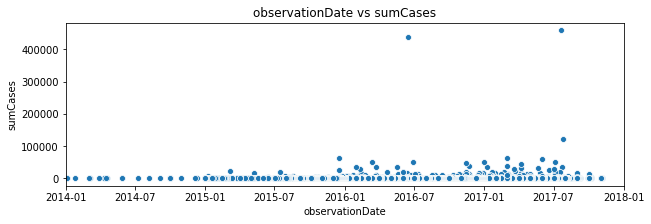

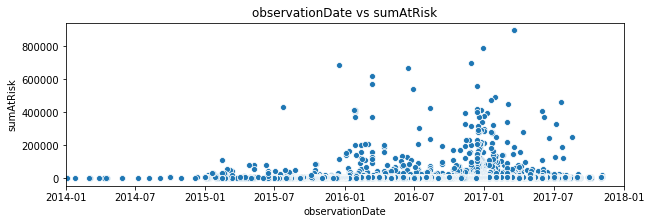

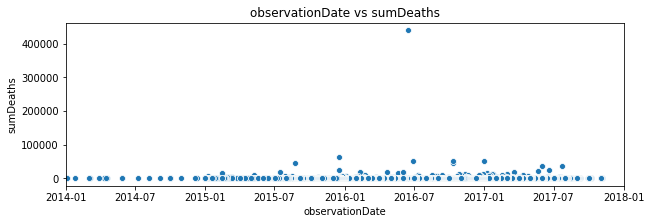

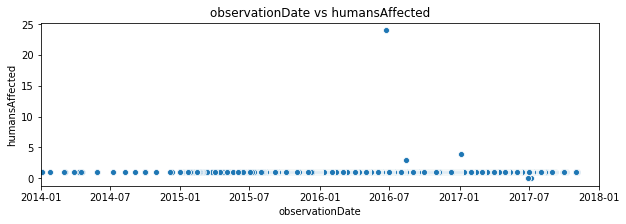

In [18]:
plt.figure(figsize=(10,3))
scatterplot = sns.scatterplot(x=outbreaks['observationDate'], y=outbreaks['sumCases'])
scatterplot.set_xlim(pd.Timestamp('2014-01-01'), pd.Timestamp('2018-01-01'))
plt.title('observationDate vs sumCases')
plt.show()

plt.figure(figsize=(10,3))
scatterplot = sns.scatterplot(x=outbreaks['observationDate'], y=outbreaks['sumAtRisk'])
scatterplot.set_xlim(pd.Timestamp('2014-01-01'), pd.Timestamp('2018-01-01'))
plt.title('observationDate vs sumAtRisk')
plt.show()

plt.figure(figsize=(10,3))
scatterplot = sns.scatterplot(x=outbreaks['observationDate'], y=outbreaks['sumDeaths'])
scatterplot.set_xlim(pd.Timestamp('2014-01-01'), pd.Timestamp('2018-01-01'))
plt.title('observationDate vs sumDeaths')
plt.show()

plt.figure(figsize=(10,3))
scatterplot = sns.scatterplot(x=outbreaks['observationDate'], y=outbreaks['humansAffected'])
scatterplot.set_xlim(pd.Timestamp('2014-01-01'), pd.Timestamp('2018-01-01'))
plt.title('observationDate vs humansAffected')
plt.show()

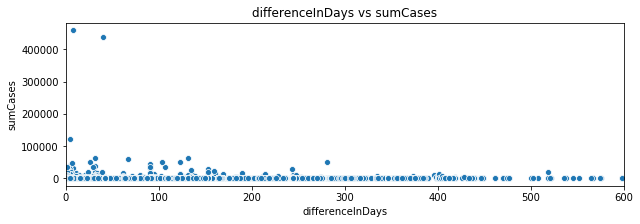

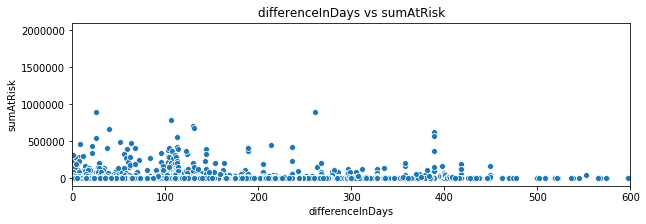

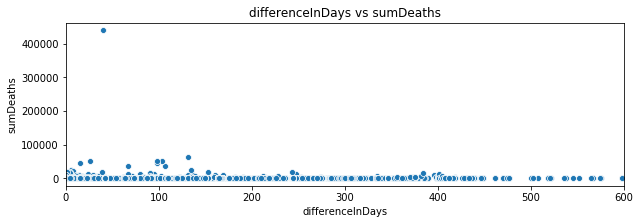

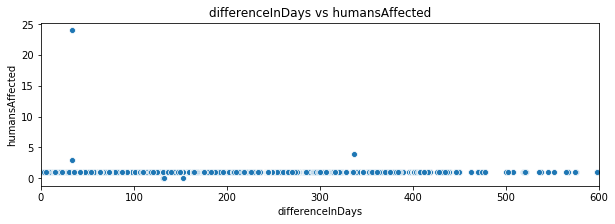

In [249]:
plt.figure(figsize=(10,3))
scatterplot = sns.scatterplot(x=outbreaks['differenceInDays'], y=outbreaks['sumCases'])
plt.title('differenceInDays vs sumCases')
scatterplot.set_xlim(0, 600)
plt.show()

plt.figure(figsize=(10,3))
scatterplot = sns.scatterplot(x=outbreaks['differenceInDays'], y=outbreaks['sumAtRisk'])
plt.title('differenceInDays vs sumAtRisk')
scatterplot.set_xlim(0, 600)
plt.show()

plt.figure(figsize=(10,3))
scatterplot = sns.scatterplot(x=outbreaks['differenceInDays'], y=outbreaks['sumDeaths'])
plt.title('differenceInDays vs sumDeaths')
scatterplot.set_xlim(0, 600)
plt.show()

plt.figure(figsize=(10,3))
scatterplot = sns.scatterplot(x=outbreaks['differenceInDays'], y=outbreaks['humansAffected'])
plt.title('differenceInDays vs humansAffected')
scatterplot.set_xlim(0, 600)
plt.show()

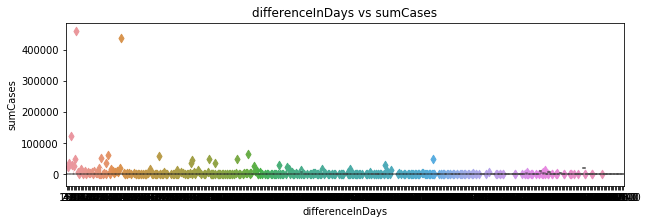

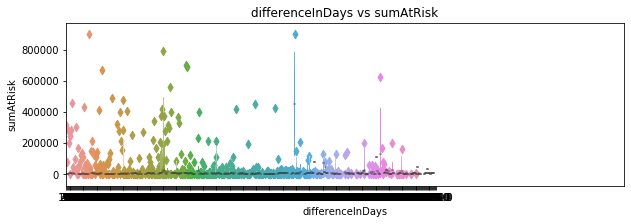

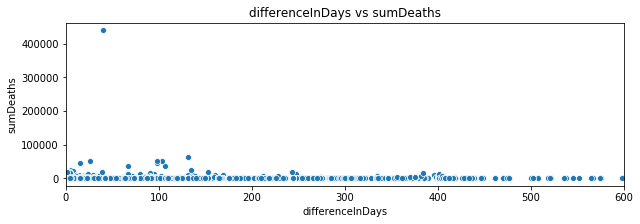

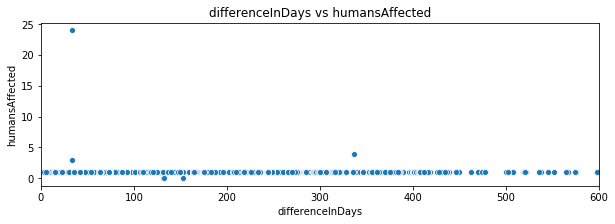

In [19]:
plt.figure(figsize=(10,3))
boxenplot = sns.boxenplot(x=outbreaks['differenceInDays'], y=outbreaks['sumCases'])
plt.title('differenceInDays vs sumCases')
scatterplot.set_xlim(0, 600)
plt.show()

plt.figure(figsize=(10,3))
boxenplot = sns.boxenplot(x=outbreaks['differenceInDays'], y=outbreaks['sumAtRisk'])
plt.title('differenceInDays vs sumAtRisk')
boxenplot.set_xlim(0, 600)
plt.show()

plt.figure(figsize=(10,3))
scatterplot = sns.scatterplot(x=outbreaks['differenceInDays'], y=outbreaks['sumDeaths'])
plt.title('differenceInDays vs sumDeaths')
scatterplot.set_xlim(0, 600)
plt.show()

plt.figure(figsize=(10,3))
scatterplot = sns.scatterplot(x=outbreaks['differenceInDays'], y=outbreaks['humansAffected'])
plt.title('differenceInDays vs humansAffected')
scatterplot.set_xlim(0, 600)
plt.show()

In [20]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
outbreaks.corr().round(4)

# Mexico : H7N3 HPAI

#Saudi Arabia : MERS-CoV

# Influenza - Avian : birds

# Brazil : Glanders

# Chile : H7N6 LPAI

# China : H7N9 LPAI

# Influenza - Equine : H3N8

,Id,latitude,longitude,sumAtRisk,sumCases,sumDeaths,sumDestroyed,sumSlaughtered,humansAge,humansAffected,humansDeaths,differenceInDays,observationYear,observationMonth,observationDay,observationFirstHalfMonth,observationSecondHalfMonth,EC,FAO Field Officer,FAO officer,FAO-Report,International reference laboratory,"National Institute for Communicable Diseases, NICD",National authorities,OIE,Other,Publications,WHO,sequence only,Africa,Americas,Asia,Europe,Albania,Algeria,Angola,Argentina,Armenia,Austria,Bahrain,Bangladesh,Belgium,Belize,Benin,Bhutan,Bosnia and Herzegovina,Botswana,Brazil,Bulgaria,Burkina Faso,Burundi,Cambodia,Cameroon,Canada,Cape Verde,Chile,China,Colombia,Croatia,Cyprus,Czech Republic,CÃ´te d'Ivoire,Democratic Republic of the Congo,Denmark,Ecuador,Egypt,El Salvador,Estonia,Finland,France,French Guiana,Gambia,Gaza Strip,Georgia,Germany,Ghana,Greece,Guinea-Bissau,"Hong Kong, SAR",Hungary,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Japan,Jordan,Kazakhstan,Kenya,Kuwait,Kyrgyzstan,Lao People's Democratic Republic,Latvia,Lebanon,Libya,Lithuania,Luxembourg,Macau,Malawi,Malaysia,Maldives,Mali,Mauritania,Mauritius,Mexico,"Moldova, Republic of",Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Netherlands,Niger,Nigeria,Oman,Panama,Philippines,Poland,Portugal,Qatar,Republic of Korea,Romania,Russian Federation,Saudi Arabia,Senegal,Serbia,Slovakia,Slovenia,South Africa,Spain,Swaziland,Sweden,Switzerland,Syrian Arab Republic,Taiwan (Province of China),Thailand,The former Yugoslav Republic of Macedonia,Togo,Tunisia,Turkey,U.K. of Great Britain and Northern Ireland,Uganda,Ukraine,United Arab Emirates,United Republic of Tanzania,United States of America,Uruguay,Viet Nam,West Bank,Zambia,Zimbabwe,Centroid Admin1,Centroid Admin2,Centroid Locality,Exact,Unknown,Confirmed,Denied,African horse sickness,African swine fever,Anthrax,Bluetongue,Bovine spongiform encephalopathy,Bovine tuberculosis,Brucellosis (Brucella abortus),Brucellosis (Brucella melitensis),Brucellosis (Brucella suis),Classical swine fever,Contagious bovine pleuropneumonia,Equine infectious anaemia,Foot and mouth disease,Glanders,Influenza - Avian,Influenza - Equine,Influenza - Swine,Lumpy skin disease,MERS-CoV,Newcastle disease,Peste des petits ruminants,Porcine reproductive and respiratory syndrome,Rabies,Rift Valley fever,Sheep pox and goat pox,West Nile Fever,1,13,14,18,19,22,3,4,7,8,A,APMV-I,Asia 1,H1N2,H3N8,H5 HPAI,H5 LPAI,H5N1 HPAI,"H5N1 HPAI, H5N2 HPAI","H5N1 HPAI, H5N6 HPAI",H5N1 LPAI,H5N2 HPAI,"H5N2 HPAI, H5N1 HPAI","H5N2 HPAI, H5N6 HPAI",H5N2 LPAI,H5N3 HPAI,H5N3 LPAI,H5N5 HPAI,H5N6 HPAI,"H5N6 HPAI, H5N1 HPAI","H5N6 HPAI, H5N1 HPAI, H5N2 HPAI","H5N6 HPAI, H5N2 HPAI","H5N6 HPAI, H5N2 HPAI, H5N1 HPAI","H5N6 HPAI, H5N6 HPAI","H5N6 HPAI, H5N8 HPAI",H5N6 LPAI,H5N8 HPAI,"H5N8 HPAI, H5N1 HPAI, H5N6 HPAI","H5N8 HPAI, H5N2 HPAI",H5N8 LPAI,H5N9 HPAI,H5N9 LPAI,H7 LPAI,H7N1 HPAI,H7N2 LPAI,H7N3 HPAI,H7N3 LPAI,H7N6 LPAI,H7N7 HPAI,H7N7 LPAI,H7N8 LPAI,H7N9 HPAI,H7N9 LPAI,H9N2 LPAI,HPAI,Not Specified,Not specified,O,SAT2,SAT3,Uknown,wild,undomestic,domestic,captive,unspecified,birds,mammals
Id,1.0000,-0.0240,0.1552,0.0690,0.0166,-0.0056,0.1015,0.0116,0.0144,-0.0053,0.0469,-0.0221,0.6878,-0.0741,0.0069,-0.0358,0.0358,-0.0350,-0.0292,-0.0069,-0.0330,0.0162,0.0043,0.1706,-0.1506,-0.0111,-0.0137,-0.0347,-0.0083,-0.1085,-0.0369,0.1270,-0.0452,0.2362,0.0176,-0.0129,-0.0094,-0.0167,0.0203,-0.0093,0.0067,0.0369,-0.0007,-0.0148,-0.0015,0.0121,-0.0608,-0.0537,-0.0466,-0.0106,-0.0144,-0.0237,-0.0133,-0.0134,-0.0148,0.0057,0.0846,0.0317,0.0099,-0.0071,0.1013,-0.0579,0.0645,0.0123,0.0131,0.0236,0.0081,-0.2976,0.0045,0.0715,NaN,0.0062,-0.0062,-0.0048,0.0692,-0.0496,-0.1118,NaN,-0.0036,0.0201,0.0167,0.0277,0.0070,-0.0249,0.0143,0.0028,0.0173,0.1162,-0.0119,-0.0031,-0.0060,-0.0377,-0.0096,-0.0113,-0.3163,-0.0091,0.0119,-0.0057,0.0115,0.0066,-0.0146,0.0261,-0.0093,0.0039,-0.0192,-0.0110,-0.0465,0.0052,0.0022,-0.0307,-0.0406,-0.0021,0.0226,0.0326,0.0213,0.

In [21]:
corr_mat = outbreaks.corr().loc[:, ['norm_humansDeaths']].abs().sort_values(by='norm_humansDeaths', ascending=False)
corr_mat

KeyError: "None of [Index(['norm_humansDeaths'], dtype='object')] are in the [columns]"

In [ ]:
features_to_test = outbreaks[['sumAtRisk', 'sumCases', 'sumDeaths', 'sumDestroyed', 'sumSlaughtered', 'humansAge',
                             'humansAffected', 'humansDeaths', 'differenceInDays']]
for feat in features_to_test:
    jb_stats = stats.jarque_bera(outbreaks[feat])
    norm_stats = stats.normaltest(outbreaks[feat])
    
    print("Testing for normality on {}:".format(feat))
    print('Jarque-Bera test statistics for', feat, 'is {0} and p value is {1}'.format(jb_stats[0], jb_stats[1]))
    print('Normality test statistics for', feat, 'is {0} and p value is {1}\n'.format(norm_stats[0], norm_stats[1]))


In [ ]:
# Specify a list with features we want to test for normality. 
# Visuals for outliers and normality

for feat in features_to_test:
    winsorized_feature = winsorize(outbreaks[feat], (0, 0.10))
    sqrt_feature = np.sqrt(outbreaks[feat])
    
    plt.tight_layout()
    print('\n Outlier Visualization for', feat, 'feature. \n')
    plt.figure(figsize = (15,10))
    plt.subplot(3, 2, 1)
    sns.boxenplot(x=feat, data=outbreaks)
    plt.title('Original')
    print('\n')
    plt.subplot(3, 2, 2)
    sns.distplot(outbreaks[feat])
    plt.title('Original Distribution')
    print('\n')
    plt.subplot(3, 2, 3)
    winsorized_feature = winsorize(outbreaks[feat], (0, 0.10))
    sns.boxenplot(winsorized_feature, color='red')
    plt.title('Winsorized Feature')
    try:
        log_feature = np.log(outbreaks[feat])
        plt.subplot(3, 2, 4)
        log_feature = np.log(outbreaks[feat])
        sns.boxenplot(log_feature, color='green')
        plt.title('Log Feature')
    except ValueError: 
        print('No log transformation for', feat, 'because not all data is positive.')
    print('\n')
    plt.subplot(3, 2, 5)
    sqrt_feature = np.sqrt(outbreaks[feat])
    sns.boxenplot(sqrt_feature, color='orange')
    plt.title('Square Rooted Feature')
    try:
        bc_feature,_ = stats.boxcox(outbreaks[feat])
        plt.subplot(3, 2, 6)
        sns.boxenplot(bc_feature, color='pink')
        plt.title('Box-Cox Transformed Feature')
        plt.subplots_adjust(hspace=0.35, wspace=0.35)
        plt.show()
    except ValueError: 
        print('No boxcox transformation for', feat, 'because not all data is positive.')

## Checking Outliers
differenceInDays: many outbreaks were reported when this data was being gathered, on September 18 of 2015. (sr)
sumAtRisk: square root
sumCases: square root
sumDeaths: log/sr
sumDestroyed: log
sumSlaughtered: log
humansAge: sr
humansAffected: sr
humansDeaths: sr


In [22]:
outbreaks['norm_differenceInDays'] = normalize(np.array(np.log(outbreaks['differenceInDays'])).reshape(1,-1)).reshape(-1,1)
outbreaks['norm_sumAtRisk'] = normalize(np.array(np.sqrt(outbreaks['sumAtRisk'])).reshape(-1, 1))
outbreaks['norm_sumCases'] = normalize(np.array(np.sqrt(outbreaks['sumCases'])).reshape(1,-1).reshape(-1,1))
outbreaks['norm_sumDestroyed'] = normalize(np.array(np.log(outbreaks['sumDestroyed'] + 1)).reshape(1,-1)).reshape(-1,1)
outbreaks['norm_sumSlaughtered'] = normalize(np.array(np.log(outbreaks['sumSlaughtered'] + 1)).reshape(1,-1)).reshape(-1,1)
outbreaks['norm_humansAge'] = normalize(np.array(np.sqrt(outbreaks['humansAge'])).reshape(1,-1)).reshape(-1,1)
outbreaks['norm_humansAffected'] = normalize(np.array(np.sqrt(outbreaks['humansAffected'])).reshape(1,-1)).reshape(-1,1)
outbreaks['norm_humansDeaths'] = normalize(np.array(np.sqrt(outbreaks['humansDeaths'])).reshape(1,-1)).reshape(-1,1)

norm_features_to_test = ['norm_differenceInDays', 'norm_sumAtRisk', 'norm_sumCases', 'norm_sumDestroyed', 
                         'norm_sumSlaughtered', 'norm_humansAge', 'norm_humansAffected', 'norm_humansDeaths']

# Now run each and one of the featues in above list. Locate the features in your data and calculate the statistics. 
for feat in norm_features_to_test:
    jb_stats = stats.jarque_bera(outbreaks[feat])
    norm_stats = stats.normaltest(outbreaks[feat])
    
    print("Testing for normality on {}:".format(feat))
    print('Jarque-Bera test statistics for', feat, 'is {0} and p value is {1}'.format(jb_stats[0], jb_stats[1]))
    print('Normality test statistics for', feat, 'is {0} and p value is {1}\n'.format(norm_stats[0], norm_stats[1]))

Testing for normality on norm_differenceInDays:
Jarque-Bera test statistics for norm_differenceInDays is 613.9940887824272 and p value is 0.0
Normality test statistics for norm_differenceInDays is 1760.3923896373988 and p value is 0.0

Testing for normality on norm_sumAtRisk:
Jarque-Bera test statistics for norm_sumAtRisk is 2046676.5838905706 and p value is 0.0
Normality test statistics for norm_sumAtRisk is 16853.327562212307 and p value is 0.0

Testing for normality on norm_sumCases:
Jarque-Bera test statistics for norm_sumCases is 93002.3029832742 and p value is 0.0
Normality test statistics for norm_sumCases is 9160.86293459418 and p value is 0.0

Testing for normality on norm_sumDestroyed:
Jarque-Bera test statistics for norm_sumDestroyed is 1823.6498306850474 and p value is 0.0
Normality test statistics for norm_sumDestroyed is 100714.73793381744 and p value is 0.0

Testing for normality on norm_sumSlaughtered:
Jarque-Bera test statistics for norm_sumSlaughtered is 2769.21266793

# Visualizations with Dimensionality Reduction

## PCA

In [23]:
# PCA with all variables, including humansDeaths
X_all = outbreaks.drop(columns=['disease', 'serotypes', 'speciesDescription', 'sumAtRisk', 'sumCases', 'sumDeaths', 
                            'sumDestroyed','sumSlaughtered', 'humansAge', 'humansAffected', 'humansDeaths', 
                            'differenceInDays', 'source','region', 'country', 'localityQuality', 'status', 
                            'observationDate', 'reportingDate'])


pca = PCA(n_components=2)
pca_components = pca.fit_transform(X_all)
print(pca.explained_variance_ratio_)

pca_80 = PCA(n_components=0.80)
pca_components_80 = pca_80.fit_transform(X_all)
print(pca_80.explained_variance_ratio_)


[9.99959485e-01 3.43949095e-05]
[0.99995948]


Cluster Graph with PCA 


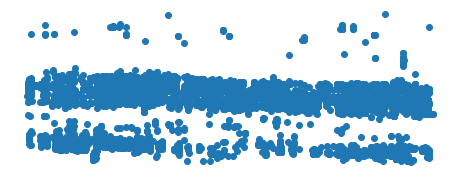

In [24]:
print('Cluster Graph with PCA ')
plt.figure(figsize=(8,3))
plt.scatter(pca_components[:, 0], pca_components[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

First two PCA components:  [0.27459426 0.1672851 ]
PCA components for 80% of variance:  [0.27459426 0.1672851  0.12719167 0.12503376 0.12429796]
Cluster Graph with PCA 


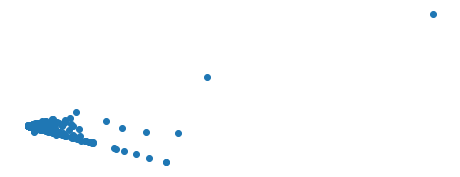

In [25]:
# PCA with floats, no humansDeaths
X_floats = outbreaks[['sumAtRisk', 'sumCases', 'sumDeaths', 'sumDestroyed','sumSlaughtered', 'humansAge',
               'humansAffected', 'differenceInDays']]

X_std = StandardScaler().fit_transform(X_floats)

pca = PCA(n_components=2)
pca_components = pca.fit_transform(X_std)
print('First two PCA components: ', pca.explained_variance_ratio_)

pca_80 = PCA(n_components=0.80)
pca_components_80 = pca_80.fit_transform(X_std)
print('PCA components for 80% of variance: ', pca_80.explained_variance_ratio_)


print('Cluster Graph with PCA ')
plt.figure(figsize=(8,3))
plt.scatter(pca_components[:, 0], pca_components[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

First two PCA components:  [0.87926528 0.11163452]
PCA components for 80% of variance:  [0.87926528]
Cluster Graph with PCA 


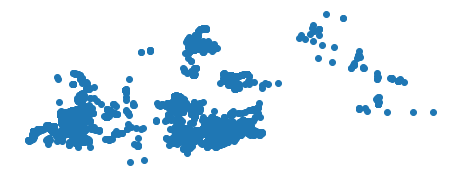

In [27]:
# PCA for features with greater than 0.01 absolute correlation with potential target

X_01 = outbreaks[['Saudi Arabia', 'H5N8 HPAI', 'H5N2 HPAI', 'norm_humansAffected', 'Portugal',
                      'WHO', 'Centroid Admin1', 'Asia', 'norm_sumSlaughtered', 'OIE', 'Other', 'National authorities',
                      'Europe', 'norm_sumDestroyed', 'Jordan', 'latitude', 'Exact', 'Centroid Locality', 
                      'observationYear', 'Uknown', 'longitude', 'mammals', 'Bluetongue', 'birds', 'H7N9 LPAI',
                      'African swine fever', 'France', 'China', 'H5N8 HPAI', 'wild', '8', 'norm_humansAge', 
                      'observationMonth', 'Lumpy skin disease', 'Taiwan (Province of China)', 'Malaysia', 'Rabies',
                      'Africa', 'unspecified', '4', 'FAO Field Officer', 'norm_sumCases', 'H5N1 HPAI', 'Albania',
                      'Latvia', 'Serbia', 'Estonia', 'Russian Federation', 'Republic of Korea']]

pca = PCA(n_components=2)
pca_components = pca.fit_transform(X_01)
print('First two PCA components: ', pca.explained_variance_ratio_)

pca_80 = PCA(n_components=0.80)
pca_components_80 = pca_80.fit_transform(X_01)
print('PCA components for 80% of variance: ', pca_80.explained_variance_ratio_)


print('Cluster Graph with PCA ')
plt.figure(figsize=(8,3))
plt.scatter(pca_components[:, 0], pca_components[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## TSNE

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 12702 samples in 0.166s...
[t-SNE] Computed neighbors for 12702 samples in 1.133s...
[t-SNE] Computed conditional probabilities for sample 1000 / 12702
[t-SNE] Computed conditional probabilities for sample 2000 / 12702
[t-SNE] Computed conditional probabilities for sample 3000 / 12702
[t-SNE] Computed conditional probabilities for sample 4000 / 12702
[t-SNE] Computed conditional probabilities for sample 5000 / 12702
[t-SNE] Computed conditional probabilities for sample 6000 / 12702
[t-SNE] Computed conditional probabilities for sample 7000 / 12702
[t-SNE] Computed conditional probabilities for sample 8000 / 12702
[t-SNE] Computed conditional probabilities for sample 9000 / 12702
[t-SNE] Computed conditional probabilities for sample 10000 / 12702
[t-SNE] Computed conditional probabilities for sample 11000 / 12702
[t-SNE] Computed conditional probabilities for sample 12000 / 12702
[t-SNE] Computed conditional probabilities for sam

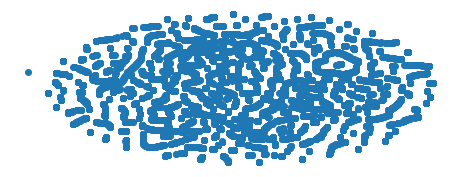

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 12702 samples in 0.147s...
[t-SNE] Computed neighbors for 12702 samples in 1.301s...
[t-SNE] Computed conditional probabilities for sample 1000 / 12702
[t-SNE] Computed conditional probabilities for sample 2000 / 12702
[t-SNE] Computed conditional probabilities for sample 3000 / 12702
[t-SNE] Computed conditional probabilities for sample 4000 / 12702
[t-SNE] Computed conditional probabilities for sample 5000 / 12702
[t-SNE] Computed conditional probabilities for sample 6000 / 12702
[t-SNE] Computed conditional probabilities for sample 7000 / 12702
[t-SNE] Computed conditional probabilities for sample 8000 / 12702
[t-SNE] Computed conditional probabilities for sample 9000 / 12702
[t-SNE] Computed conditional probabilities for sample 10000 / 12702
[t-SNE] Computed conditional probabilities for sample 11000 / 12702
[t-SNE] Computed conditional probabilities for sample 12000 / 12702
[t-SNE] Computed conditional probabilities for sam

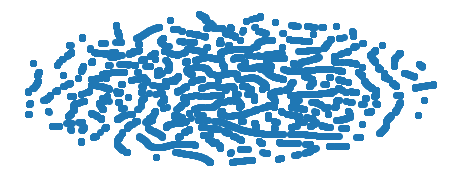

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 12702 samples in 0.157s...
[t-SNE] Computed neighbors for 12702 samples in 1.488s...
[t-SNE] Computed conditional probabilities for sample 1000 / 12702
[t-SNE] Computed conditional probabilities for sample 2000 / 12702
[t-SNE] Computed conditional probabilities for sample 3000 / 12702
[t-SNE] Computed conditional probabilities for sample 4000 / 12702
[t-SNE] Computed conditional probabilities for sample 5000 / 12702
[t-SNE] Computed conditional probabilities for sample 6000 / 12702
[t-SNE] Computed conditional probabilities for sample 7000 / 12702
[t-SNE] Computed conditional probabilities for sample 8000 / 12702
[t-SNE] Computed conditional probabilities for sample 9000 / 12702
[t-SNE] Computed conditional probabilities for sample 10000 / 12702
[t-SNE] Computed conditional probabilities for sample 11000 / 12702
[t-SNE] Computed conditional probabilities for sample 12000 / 12702
[t-SNE] Computed conditional probabilities for sam

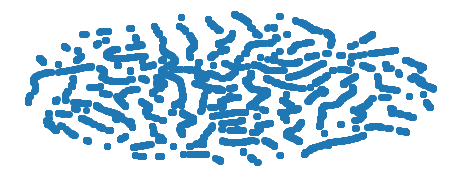

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 12702 samples in 0.150s...
[t-SNE] Computed neighbors for 12702 samples in 1.731s...
[t-SNE] Computed conditional probabilities for sample 1000 / 12702
[t-SNE] Computed conditional probabilities for sample 2000 / 12702
[t-SNE] Computed conditional probabilities for sample 3000 / 12702
[t-SNE] Computed conditional probabilities for sample 4000 / 12702
[t-SNE] Computed conditional probabilities for sample 5000 / 12702
[t-SNE] Computed conditional probabilities for sample 6000 / 12702
[t-SNE] Computed conditional probabilities for sample 7000 / 12702
[t-SNE] Computed conditional probabilities for sample 8000 / 12702
[t-SNE] Computed conditional probabilities for sample 9000 / 12702
[t-SNE] Computed conditional probabilities for sample 10000 / 12702
[t-SNE] Computed conditional probabilities for sample 11000 / 12702
[t-SNE] Computed conditional probabilities for sample 12000 / 12702
[t-SNE] Computed conditional probabilities for sa

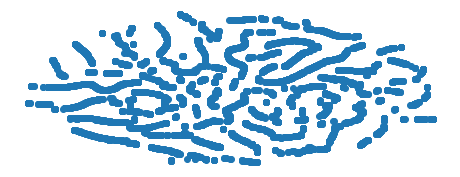

In [388]:
for perplexity in [10, 20, 30, 40]:
    tsne = TSNE(n_components=2, verbose=1, perplexity=perplexity, n_iter=300)
    tsne_results = tsne.fit_transform(X_all)
    print('Cluster Graph with t-SNE with Perplexity ', perplexity)
    plt.figure(figsize=(8,3))
    plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()

In [1]:
for perplexity in [10, 20, 30, 40]:
    tsne = TSNE(n_components=2, verbose=1, perplexity=perplexity, n_iter=300)
    tsne_results = tsne.fit_transform(X_floats)
    print('Cluster Graph with t-SNE with Perplexity ', perplexity)
    plt.figure(figsize=(8,3))
    plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()

NameError: name 'TSNE' is not defined

In [ ]:
for perplexity in [10, 20, 30, 40]:
    tsne = TSNE(n_components=2, verbose=1, perplexity=perplexity, n_iter=300)
    tsne_results = tsne.fit_transform(X_01)
    print('Cluster Graph with t-SNE with Perplexity ', perplexity)
    plt.figure(figsize=(8,3))
    plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()

## UMAP

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/utils.py", line 409:
@numba.njit(parallel=True)
def build_candidates(current_graph, n_vertices, n_neighbors, max_candidates, rng_state):
^

  current_graph, n_vertices, n_neighbors, max_candidates, rng_state
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPe

UMAP with  5 neighbors and  0.01 minimum distance.


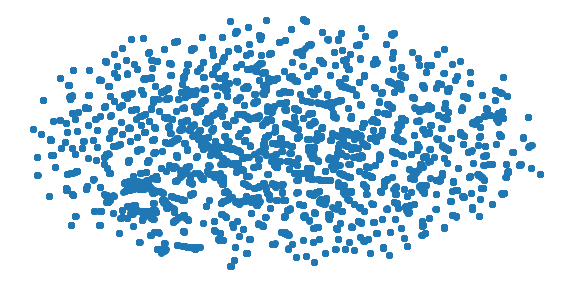

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 235 separate connected components using meta-embedding (experimental)
  n_comp

UMAP with  5 neighbors and  0.1 minimum distance.


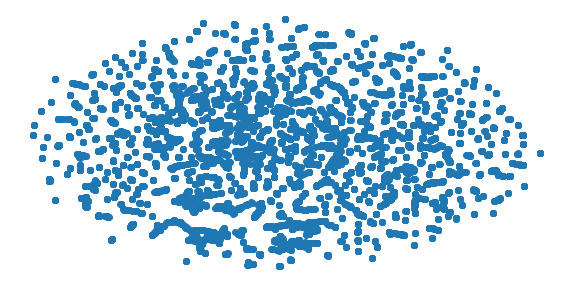

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 226 separate connected components using meta-embedding (experimental)
  n_comp

UMAP with  5 neighbors and  0.5 minimum distance.


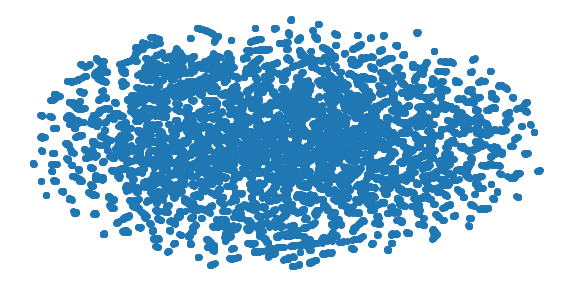

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 42 separate connected components using meta-embedding (experimental)
  n_compo

UMAP with  10 neighbors and  0.01 minimum distance.


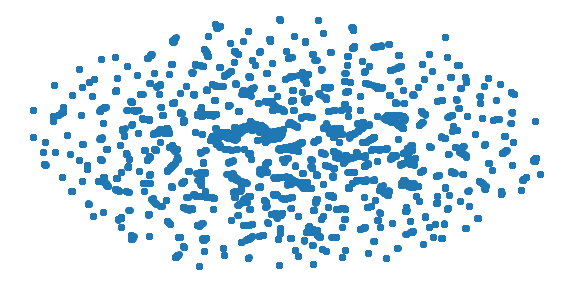

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 50 separate connected components using meta-embedding (experimental)
  n_compo

UMAP with  10 neighbors and  0.1 minimum distance.


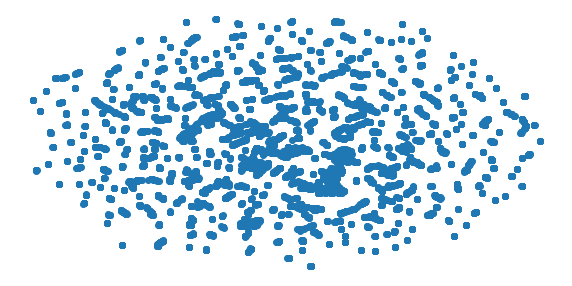

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 49 separate connected components using meta-embedding (experimental)
  n_compo

UMAP with  10 neighbors and  0.5 minimum distance.


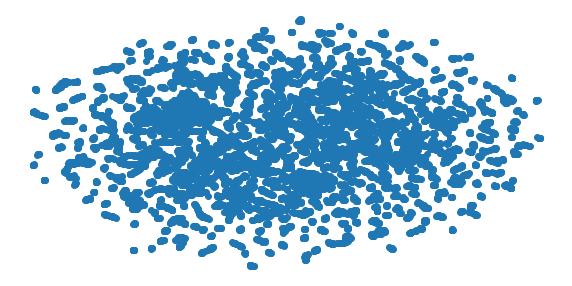

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 17 separate connected components using meta-embedding (experimental)
  n_compo

UMAP with  15 neighbors and  0.01 minimum distance.


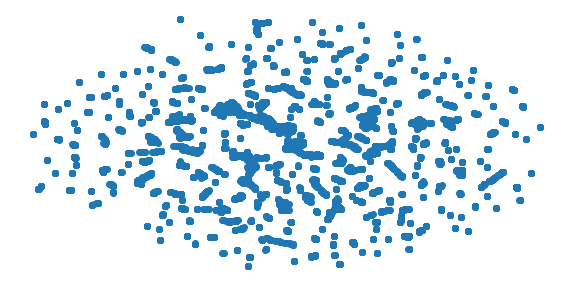

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 14 separate connected components using meta-embedding (experimental)
  n_compo

UMAP with  15 neighbors and  0.1 minimum distance.


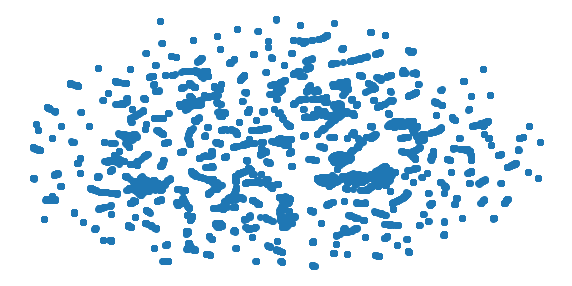

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 15 separate connected components using meta-embedding (experimental)
  n_compo

UMAP with  15 neighbors and  0.5 minimum distance.


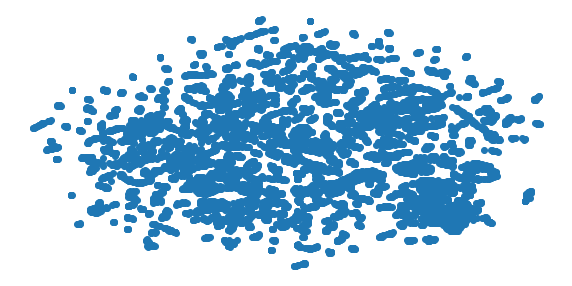

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_compon

UMAP with  25 neighbors and  0.01 minimum distance.


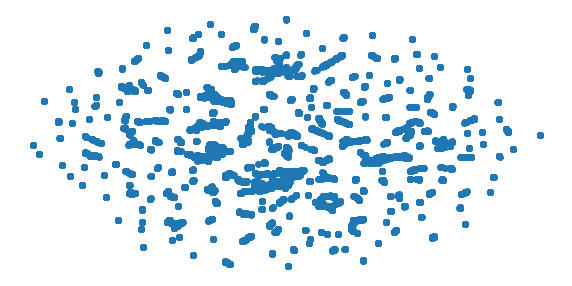

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_compon

UMAP with  25 neighbors and  0.1 minimum distance.


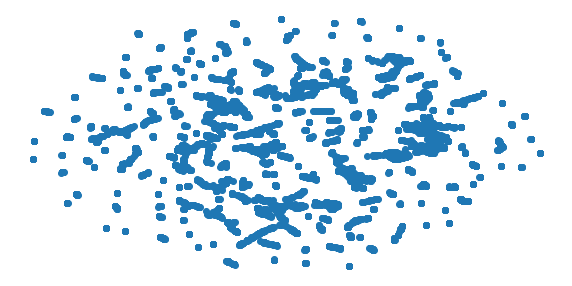

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_compon

UMAP with  25 neighbors and  0.5 minimum distance.


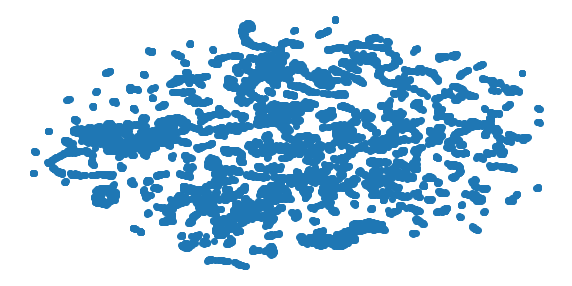

In [389]:
for n_neighbors in [5, 10, 15, 25]:
    for min_dist in [ 0.01, 0.1, 0.5]:
        umap_results = umap.UMAP(n_neighbors=n_neighbors,
                      min_dist=min_dist,
                      metric='correlation').fit_transform(X)
        print('UMAP with ', n_neighbors, 'neighbors and ', min_dist, 'minimum distance.')
        plt.figure(figsize=(10,5))
        plt.scatter(umap_results[:, 0], umap_results[:, 1])
        plt.xticks([])
        plt.yticks([])
        plt.axis('off')
        plt.show()
        print('\n')
        


## UMAP

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  50 neighbors and  0.01 minimum distance.


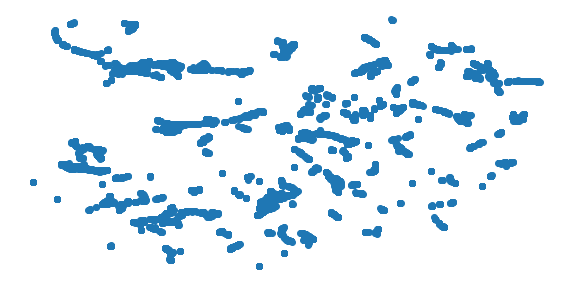

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  50 neighbors and  0.1 minimum distance.


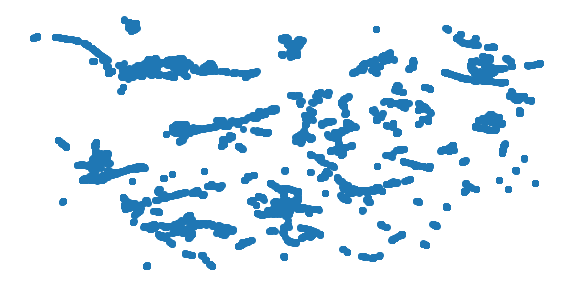

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  50 neighbors and  0.5 minimum distance.


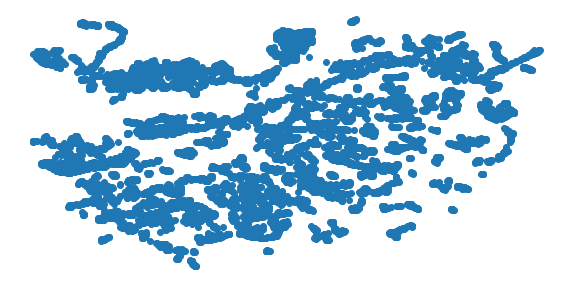

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  50 neighbors and  0.75 minimum distance.


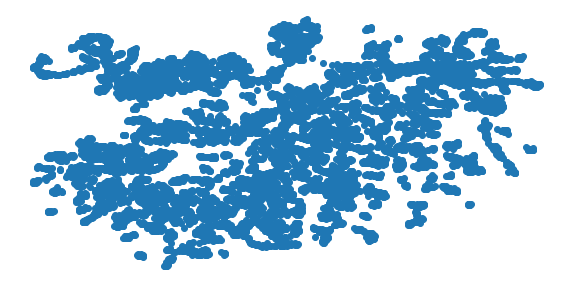

//anaconda3/lib/python3.7/site-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  50 neighbors and  1 minimum distance.


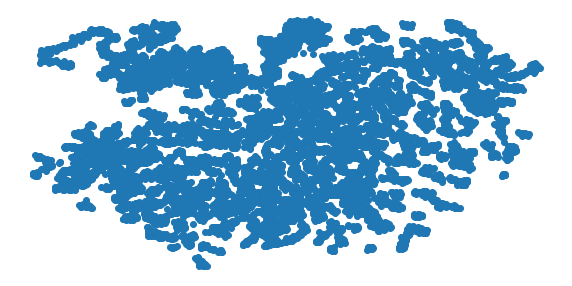

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  100 neighbors and  0.01 minimum distance.


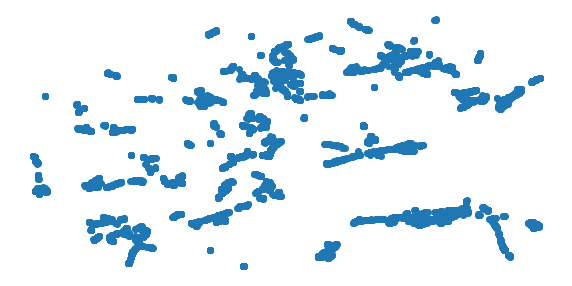

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  100 neighbors and  0.1 minimum distance.


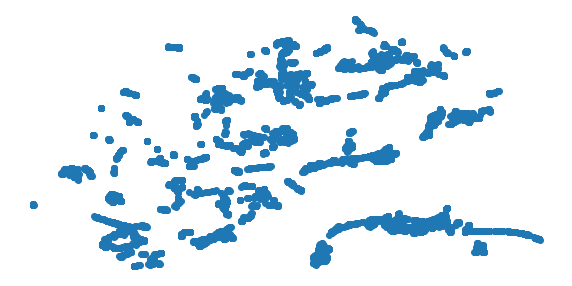

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  100 neighbors and  0.5 minimum distance.


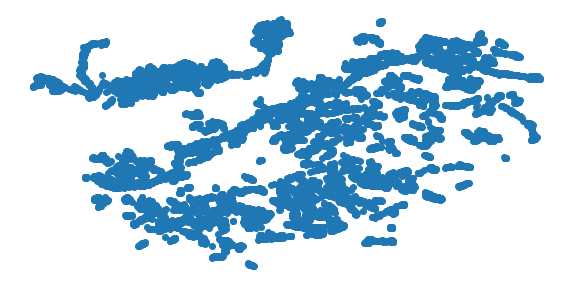

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  100 neighbors and  0.75 minimum distance.


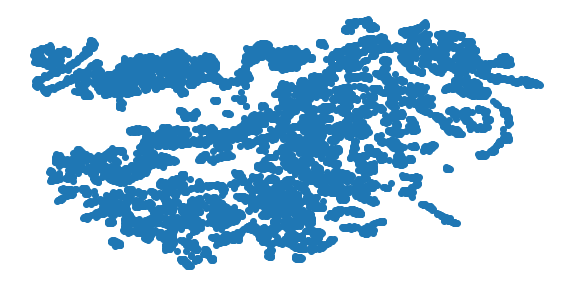

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  100 neighbors and  1 minimum distance.


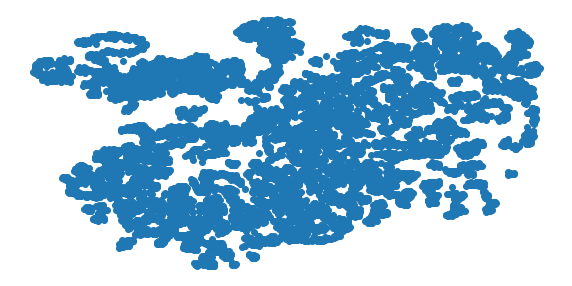

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  250 neighbors and  0.01 minimum distance.


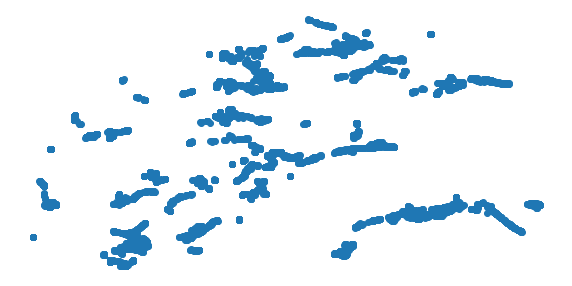

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  250 neighbors and  0.1 minimum distance.


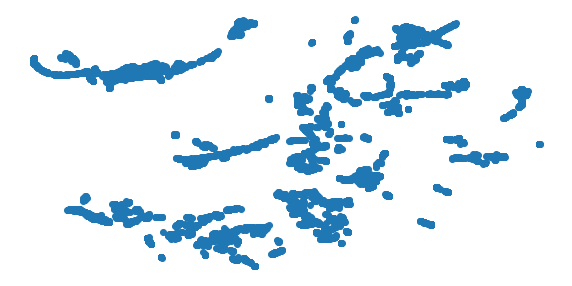

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  250 neighbors and  0.5 minimum distance.


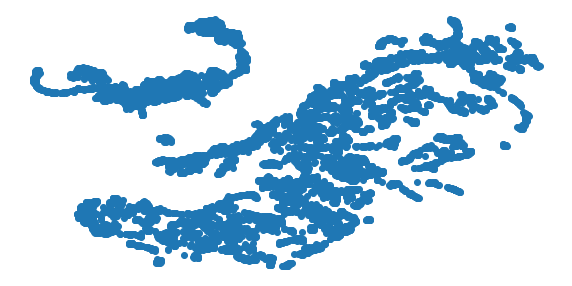

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  250 neighbors and  0.75 minimum distance.


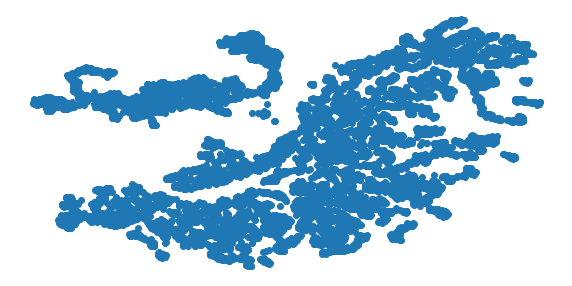

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  250 neighbors and  1 minimum distance.


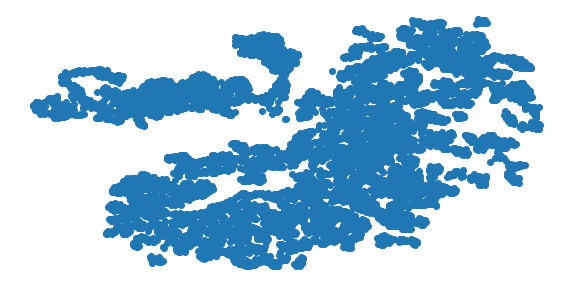

In [392]:
# UMAP with all features
for n_neighbors in [50, 100, 250]:
    for min_dist in [ 0.01, 0.1, 0.5, 0.75, 1]:
        umap_results = umap.UMAP(n_neighbors=n_neighbors,
                      min_dist=min_dist,
                      metric='correlation').fit_transform(X)
        print('UMAP with ', n_neighbors, 'neighbors and ', min_dist, 'minimum distance.')
        plt.figure(figsize=(10,5))
        plt.scatter(umap_results[:, 0], umap_results[:, 1])
        plt.xticks([])
        plt.yticks([])
        plt.axis('off')
        plt.show()
        print('\n')

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


UMAP with  50 neighbors and  0.01 minimum distance.


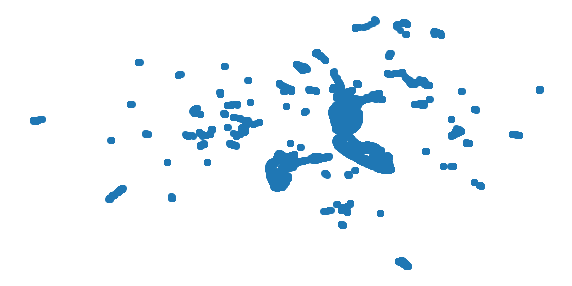

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


UMAP with  50 neighbors and  0.1 minimum distance.


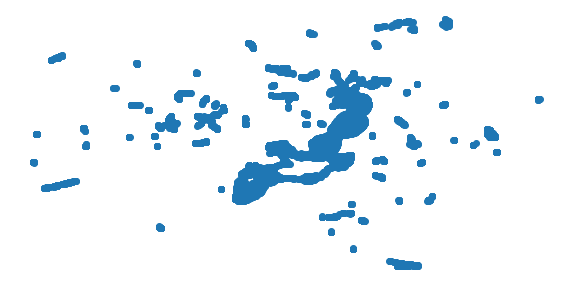

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


UMAP with  50 neighbors and  0.5 minimum distance.


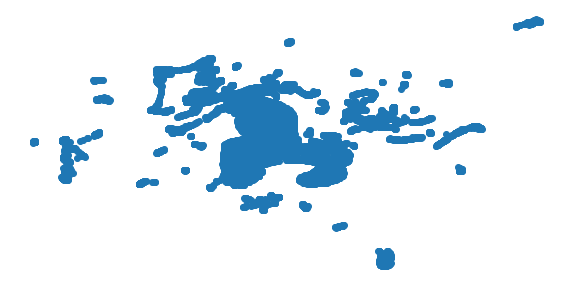

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


UMAP with  50 neighbors and  0.75 minimum distance.


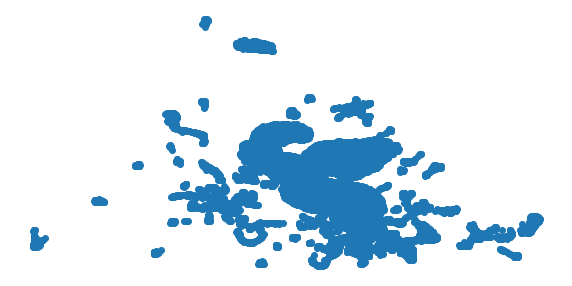

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
//anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


UMAP with  50 neighbors and  1 minimum distance.


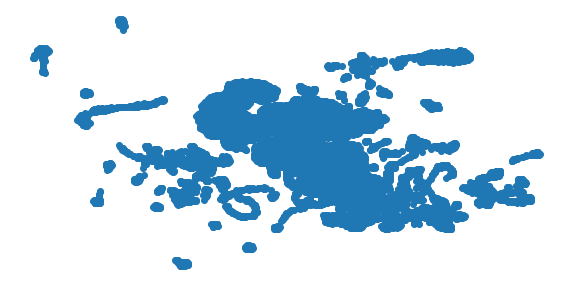

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  100 neighbors and  0.01 minimum distance.


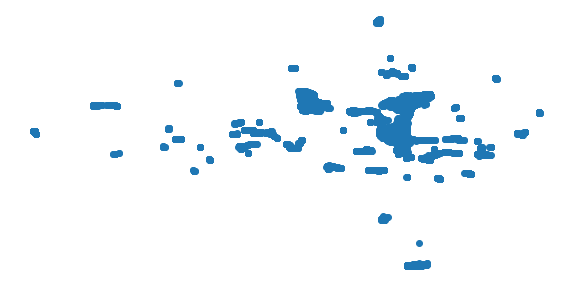

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  100 neighbors and  0.1 minimum distance.


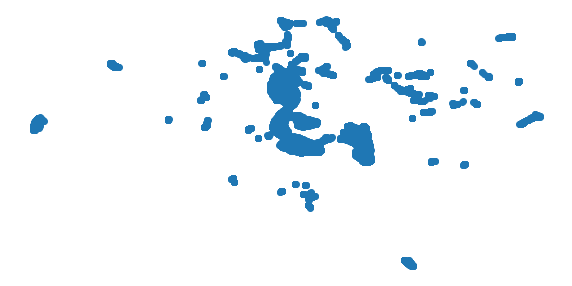

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  100 neighbors and  0.5 minimum distance.


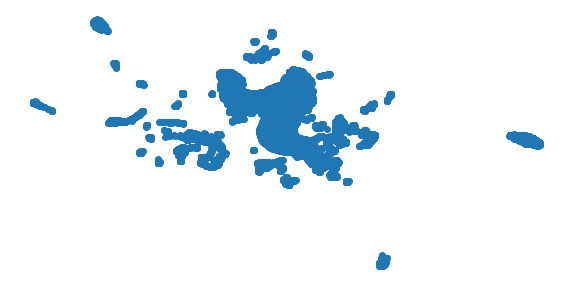

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  100 neighbors and  0.75 minimum distance.


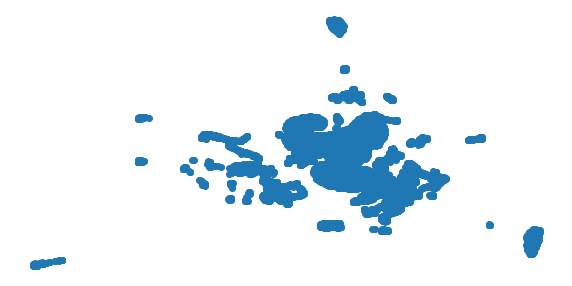

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  100 neighbors and  1 minimum distance.


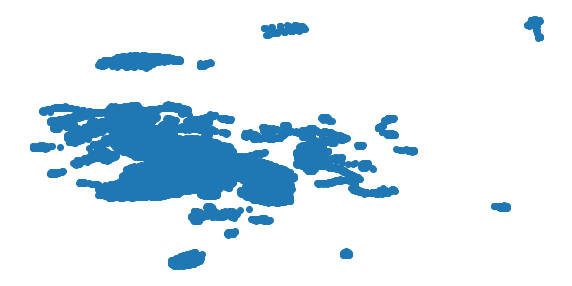

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  250 neighbors and  0.01 minimum distance.


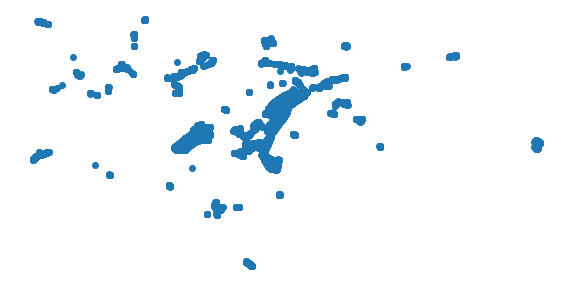

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  250 neighbors and  0.1 minimum distance.


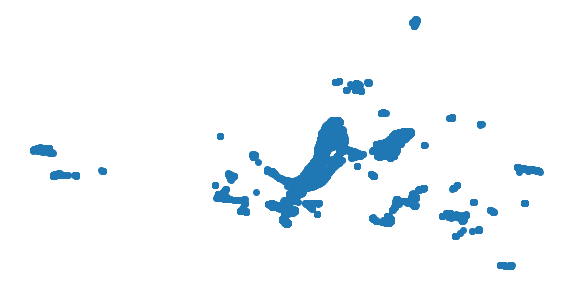

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  250 neighbors and  0.5 minimum distance.


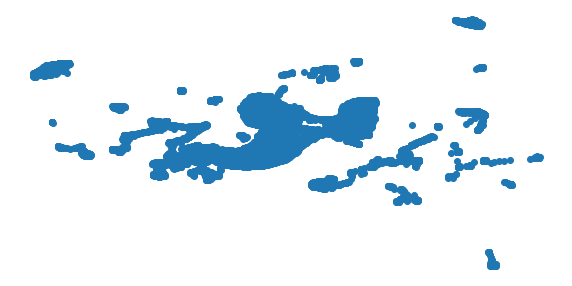

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  250 neighbors and  0.75 minimum distance.


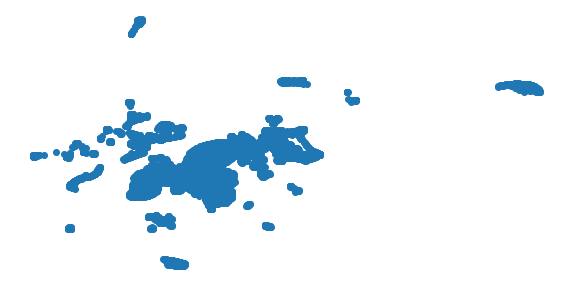

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP with  250 neighbors and  1 minimum distance.


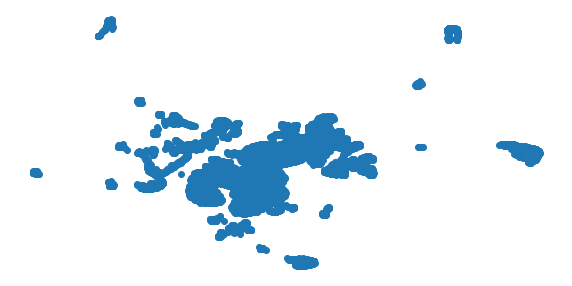

In [427]:
# UMAP with float features
for n_neighbors in [50, 100, 250]:
    for min_dist in [ 0.01, 0.1, 0.5, 0.75, 1]:
        umap_results = umap.UMAP(n_neighbors=n_neighbors,
                      min_dist=min_dist,
                      metric='correlation').fit_transform(X_floats)
        print('UMAP with ', n_neighbors, 'neighbors and ', min_dist, 'minimum distance.')
        plt.figure(figsize=(10,5))
        plt.scatter(umap_results[:, 0], umap_results[:, 1])
        plt.xticks([])
        plt.yticks([])
        plt.axis('off')
        plt.show()
        print('\n')

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/utils.py", line 409:
@numba.njit(parallel=True)
def build_candidates(current_graph, n_vertices, n_neighbors, max_candidates, rng_state):
^

  current_graph, n_vertices, n_neighbors, max_candidates, rng_state
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.p

UMAP with  50 neighbors and  0.01 minimum distance.


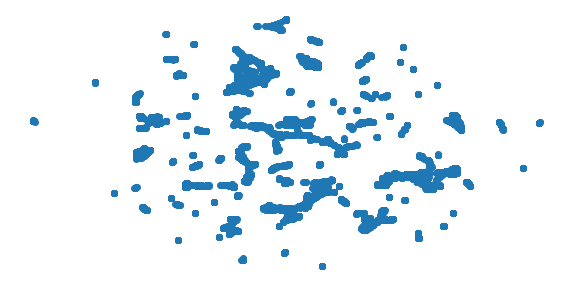

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


UMAP with  50 neighbors and  0.1 minimum distance.


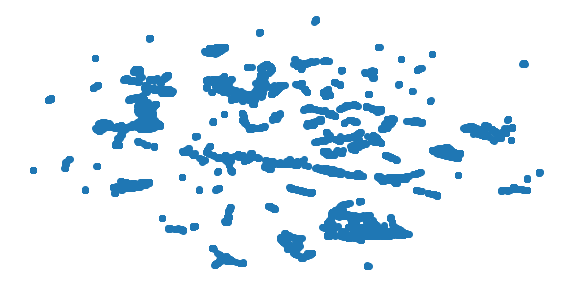

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


UMAP with  50 neighbors and  0.5 minimum distance.


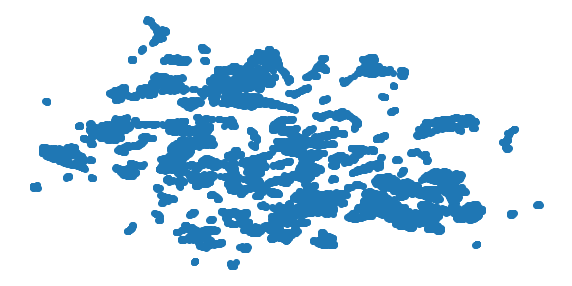

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


UMAP with  50 neighbors and  0.75 minimum distance.


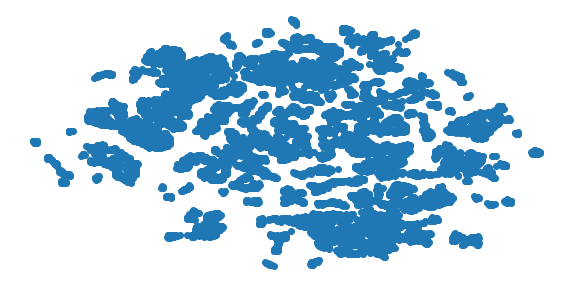

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


UMAP with  50 neighbors and  1 minimum distance.


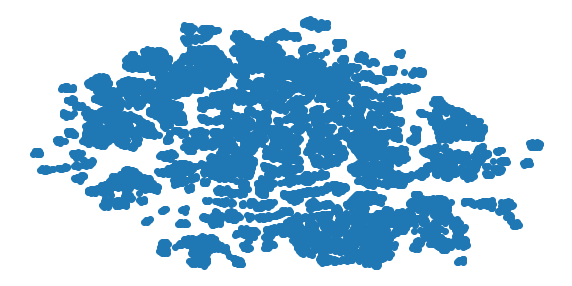

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


UMAP with  100 neighbors and  0.01 minimum distance.


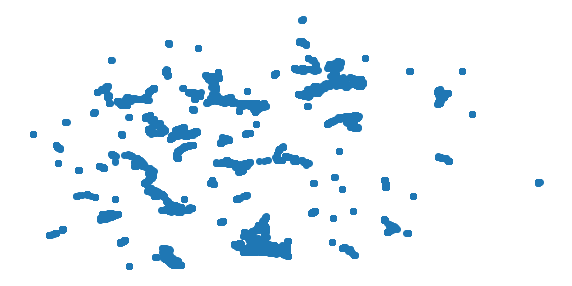

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


UMAP with  100 neighbors and  0.1 minimum distance.


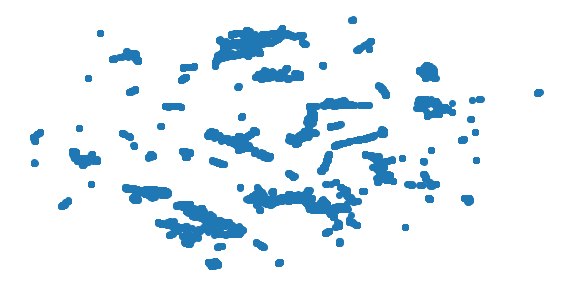

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


UMAP with  100 neighbors and  0.5 minimum distance.


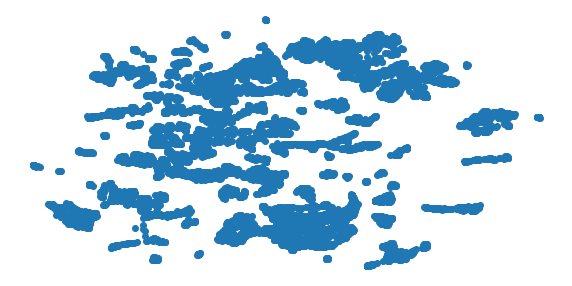

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


UMAP with  100 neighbors and  0.75 minimum distance.


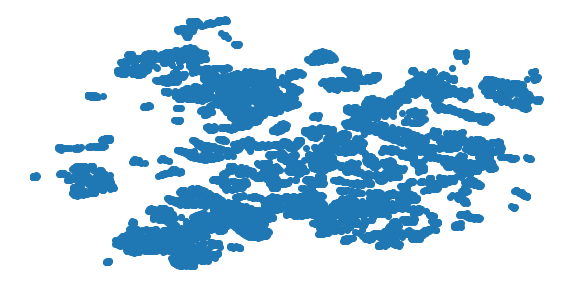

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


UMAP with  100 neighbors and  1 minimum distance.


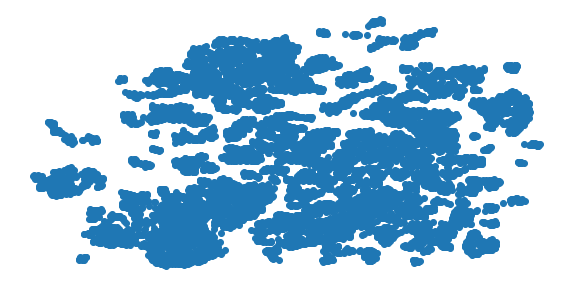

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


UMAP with  250 neighbors and  0.01 minimum distance.


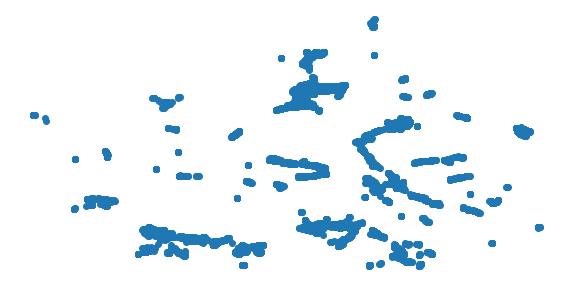

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


UMAP with  250 neighbors and  0.1 minimum distance.


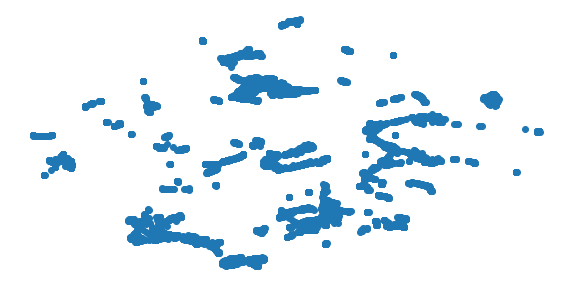

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


UMAP with  250 neighbors and  0.5 minimum distance.


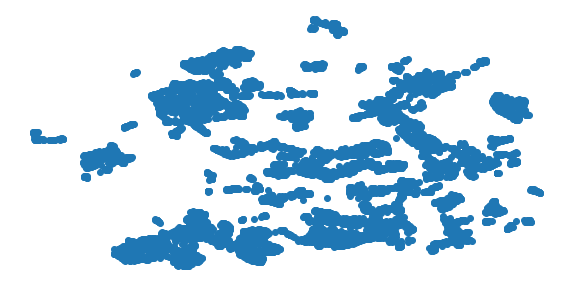

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


UMAP with  250 neighbors and  0.75 minimum distance.


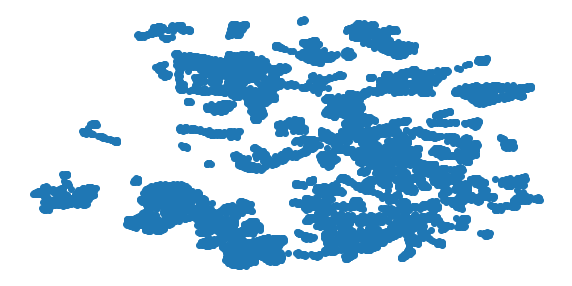

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


UMAP with  250 neighbors and  1 minimum distance.


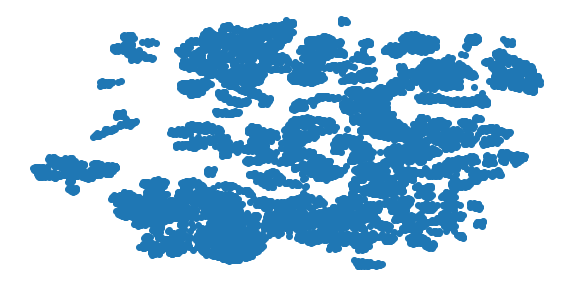

In [30]:
# UMAP with >0.01 correlation
for n_neighbors in [100, 250]:
    for min_dist in [0.1, 0.5, 0.75, 1]:
        umap_results = umap.UMAP(n_neighbors=n_neighbors,
                      min_dist=min_dist,
                      metric='correlation').fit_transform(X_01)
        print('UMAP with ', n_neighbors, 'neighbors and ', min_dist, 'minimum distance.')
        plt.figure(figsize=(10,5))
        plt.scatter(umap_results[:, 0], umap_results[:, 1])
        plt.xticks([])
        plt.yticks([])
        plt.axis('off')
        plt.show()
        print('\n')

For your third capstone, you’ll complete an unsupervised learning project. You can choose your own research question or choose from one below.

Go out and find a dataset of interest. It could be one that helps you work on one of our recommended research questions, or any other dataset that addresses an unsupervised learning question of your own.

Explore the data. Get to know the data. Spend a lot of time going over its quirks and peccadilloes. You should understand how it was gathered, what's in it, and what the variables look like.

You should try several different approaches and really work to tune a variety of models before choosing what you consider to be the best performer.

Things to keep in mind: how do clustering and modeling compare? What are the advantages of each? Why would you want to use one over the other?

Be prepared to talk about:

- Your end-user and the value your project provides to them.
- Quantifiable results based on the research you’ve conducted.
- The visuals you chose and what they represent for your research.
- Next steps you'd take to expand on your work.
- A specified research question your model addresses.
- How you chose your model specification and what alternatives you compared it to.
- The practical uses of your model for an audience of interest.
- Any weak points or shortcomings of your model.


# Clustering

## K-Means for all features with PCA Components

K-means with 2 clusters.
78.5 ms ± 887 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)
Silhouette Score:  0.6449482300505869


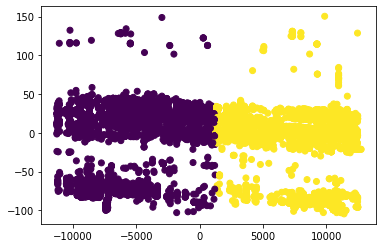



K-means with 4 clusters.
215 ms ± 6.23 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Silhouette Score:  0.5940712775863431


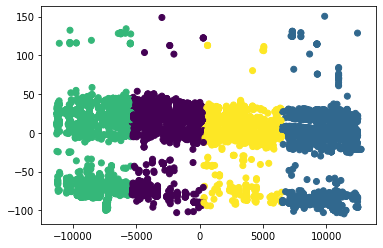



K-means with 6 clusters.
268 ms ± 38.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Silhouette Score:  0.5593092347028402


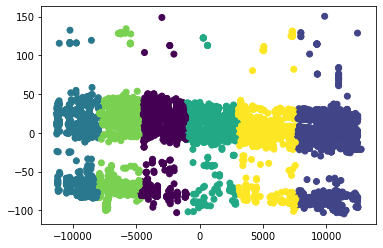



K-means with 8 clusters.
402 ms ± 127 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Silhouette Score:  0.5687786474903769


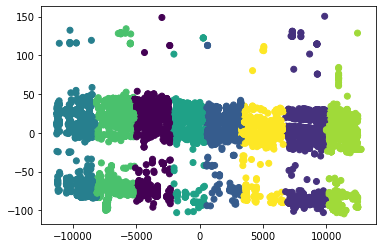

In [415]:
# K-means with PCA with all variables, including humansDeaths
X_all = outbreaks.drop(columns=['disease', 'serotypes', 'speciesDescription', 'sumAtRisk', 'sumCases', 'sumDeaths', 
                            'sumDestroyed','sumSlaughtered', 'humansAge', 'humansAffected', 'humansDeaths', 
                            'differenceInDays', 'source','region', 'country', 'localityQuality', 'status', 
                            'observationDate', 'reportingDate'])


pca = PCA(n_components=2)
pca_components = pca.fit_transform(X_all)
clusters = [2, 4, 6, 8]


for cluster in clusters:
    
    print('K-means with', cluster, 'clusters.')
    labels = KMeans(n_clusters= cluster, random_state=123).fit_predict(pca_components)
    kmeans_cluster = KMeans(n_clusters=cluster, random_state=123)
    %timeit kmeans_cluster.fit(pca_components)
    y_pred = kmeans_cluster.predict(pca_components)
#     print('ARI Score: ', metrics.adjusted_rand_score(y, y_pred))
    print('Silhouette Score: ', metrics.silhouette_score(pca_components, labels, metric='euclidean'))
    plt.scatter(pca_components[:,0], pca_components[:,1], c=y_pred)
    plt.show()
    print('\n')

## K-Means with floats features with PCA components

In [ ]:
pca = PCA(n_components=2)
pca_components = pca.fit_transform(X_floats)
clusters = [2, 3, 4, 6, 8]


for cluster in clusters:
    
    print('K-means with', cluster, 'clusters.')
    labels = KMeans(n_clusters= cluster, random_state=123).fit_predict(pca_components)
    kmeans_cluster = KMeans(n_clusters=cluster, random_state=123)
    %timeit kmeans_cluster.fit(pca_components)
    y_pred = kmeans_cluster.predict(pca_components)
#     print('ARI Score: ', metrics.adjusted_rand_score(y, y_pred))
    print('Silhouette Score: ', metrics.silhouette_score(pca_components, labels, metric='euclidean'))
    plt.scatter(pca_components[:,0], pca_components[:,1], c=y_pred)
    plt.show()
    print('\n')

## K-Means with greater correlation with PCA components

K-means with 2 clusters.
58.3 ms ± 9.84 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
Silhouette Score:  0.7651633858531575


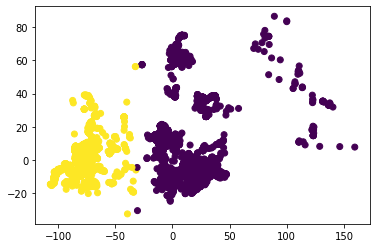



K-means with 3 clusters.
101 ms ± 4.63 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
Silhouette Score:  0.5875700326681769


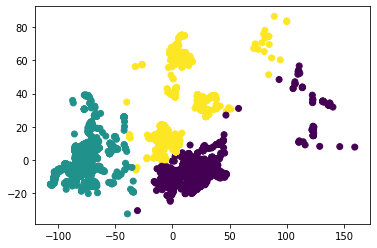



K-means with 4 clusters.
143 ms ± 9.37 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
Silhouette Score:  0.5303985179603384


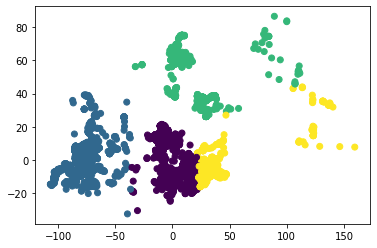

In [425]:
# K-means with PCA for features with greater than 0.01 absolute correlation with potential target

X_01 = outbreaks[['Saudi Arabia', 'H5N8 HPAI', 'H5N2 HPAI', 'norm_humansAffected', 'Portugal',
                      'WHO', 'Centroid Admin1', 'Asia', 'norm_sumSlaughtered', 'OIE', 'Other', 'National authorities',
                      'Europe', 'norm_sumDestroyed', 'Jordan', 'latitude', 'Exact', 'Centroid Locality', 
                      'observationYear', 'Uknown', 'longitude', 'mammals', 'Bluetongue', 'birds', 'H7N9 LPAI',
                      'African swine fever', 'France', 'China', 'H5N8 HPAI', 'wild', '8', 'norm_humansAge', 
                      'observationMonth', 'Lumpy skin disease', 'Taiwan (Province of China)', 'Malaysia', 'Rabies',
                      'Africa', 'unspecified', '4', 'FAO Field Officer', 'norm_sumCases', 'H5N1 HPAI', 'Albania',
                      'Latvia', 'Serbia', 'Estonia', 'Russian Federation', 'Republic of Korea']]

pca = PCA(n_components=2)
pca_components = pca.fit_transform(X_01)
clusters = [2, 3, 4]


for cluster in clusters:
    
    print('K-means with', cluster, 'clusters.')
    labels = KMeans(n_clusters= cluster, random_state=123).fit_predict(pca_components)
    kmeans_cluster = KMeans(n_clusters=cluster, random_state=123)
    %timeit kmeans_cluster.fit(pca_components)
    y_pred = kmeans_cluster.predict(pca_components)
#     print('ARI Score: ', metrics.adjusted_rand_score(y, y_pred))
    print('Silhouette Score: ', metrics.silhouette_score(pca_components, labels, metric='euclidean'))
    silhouettes.append(metrics.silhouette_score(pca_components, clusters, metric='euclidean'))
    plt.scatter(pca_components[:,0], pca_components[:,1], c=y_pred)
    plt.show()
    print('\n')
    
    
print('The greatest silhouette score is {}.'.format(max(silhouettes)))

//anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


104 ms ± 1.22 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
The Silhoutte score with 2 clusters: 0.41921085119247437


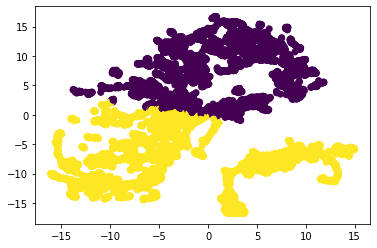



145 ms ± 11.6 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
The Silhoutte score with 3 clusters: 0.4787784814834595


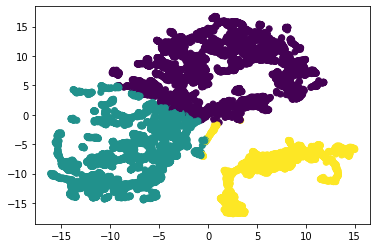



190 ms ± 11.2 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
The Silhoutte score with 4 clusters: 0.4569926857948303


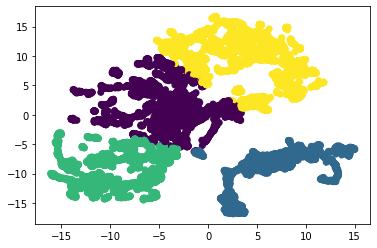

In [428]:
clusters = [2, 3, 4]
silhouettes = []
umap_results = umap.UMAP(n_neighbors=250,
                      min_dist=0.5,
                      metric='correlation').fit_transform(X_all)
for cluster in clusters: 
    k_means = KMeans(n_clusters=cluster, random_state=123)
    labels = KMeans(n_clusters= cluster, random_state=123).fit_predict(umap_results)
    %timeit k_means.fit(umap_results)
    y_pred = k_means.predict(umap_results)
    print('The Silhoutte score with', cluster, 'clusters: {}'.format(metrics.silhouette_score(umap_results, labels, metric='euclidean')))
    silhouettes.append(metrics.silhouette_score(umap_results, clusters, metric='euclidean'))
    # Plot the solution.
    plt.scatter(umap_results[:,0], umap_results[:,1], c=y_pred)
    plt.show()
    print('\n')
    
print('The greatest silhouette score is {}.'.format(max(silhouettes)))

## Agglomerative Clustering with PCA Components

The Silhoutte score with ward linkage and 2 clusters: 0.7651093603861484


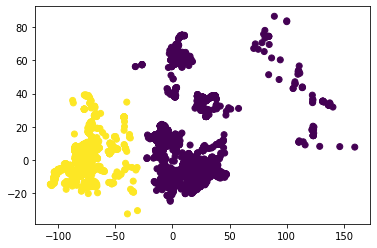



The Silhoutte score with ward linkage and 3 clusters: 0.6514183211171856


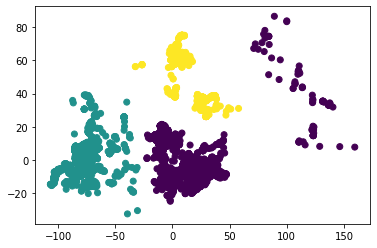



The Silhoutte score with ward linkage and 4 clusters: 0.5296700519360072


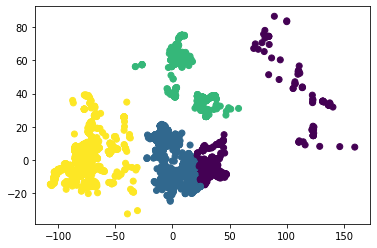



The Silhoutte score with complete linkage and 2 clusters: 0.6379243719502039


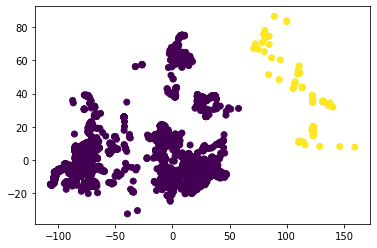



The Silhoutte score with complete linkage and 3 clusters: 0.7598511430764163


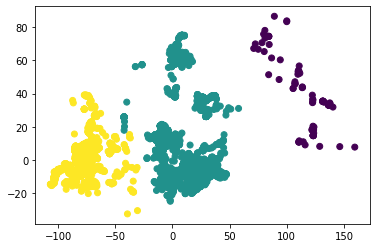



The Silhoutte score with complete linkage and 4 clusters: 0.7511637877708154


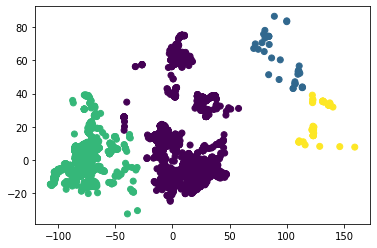



The Silhoutte score with average linkage and 2 clusters: 0.6379243719502039


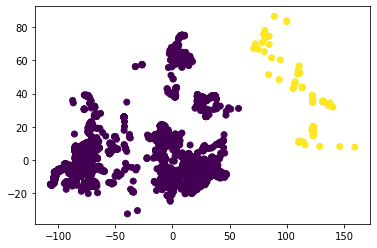



The Silhoutte score with average linkage and 3 clusters: 0.7610492175666583


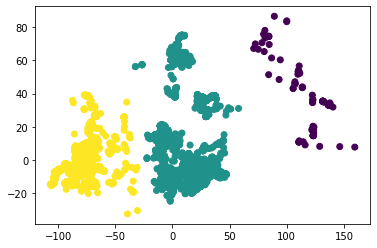



The Silhoutte score with average linkage and 4 clusters: 0.7479252714188263


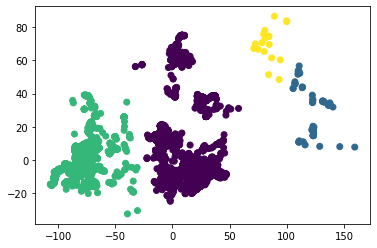

In [29]:
# With PCA components from features with greater than 0.01 correlation
pca = PCA(n_components=2)
pca_components = pca.fit_transform(X_01)

linkage = ['ward', 'complete', 'average']
numbers = [2, 3, 4]
silhouettes = []
for link in linkage:
    for cluster in numbers:
        agg_cluster = AgglomerativeClustering(linkage=link, 
                                      affinity='euclidean',
                                      n_clusters=cluster)
        clusters = agg_cluster.fit_predict(pca_components)
#         y_pred = 
        print('The Silhoutte score with', link,'linkage and', cluster, 'clusters: {}'.format(metrics.silhouette_score(pca_components, clusters, metric='euclidean')))
        plt.scatter(pca_components[:,0], pca_components[:,1], c=clusters)
        plt.show()
        silhouettes.append(metrics.silhouette_score(pca_components, clusters, metric='euclidean'))
        print('\n')
        
print('The greatest silhouette score is {}.'.format(max(silhouettes)))

## Agglomerative Clustering with UMAP

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


The Silhoutte score with ward linkage and 2 clusters: 0.3062230050563812


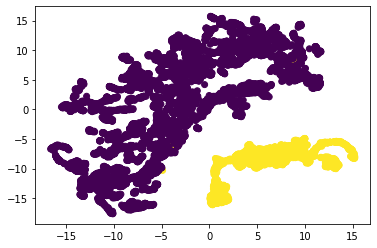



The Silhoutte score with ward linkage and 3 clusters: 0.08833117038011551


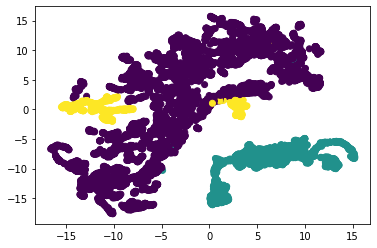



The Silhoutte score with ward linkage and 4 clusters: 0.08874513953924179


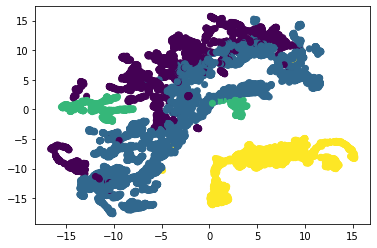



The Silhoutte score with complete linkage and 2 clusters: 0.056622110307216644


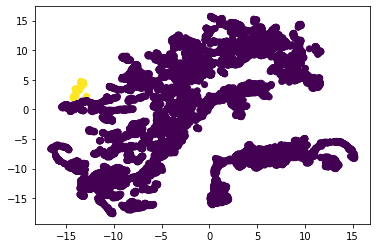



The Silhoutte score with complete linkage and 3 clusters: 0.0997893363237381


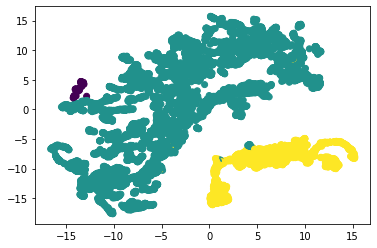



The Silhoutte score with complete linkage and 4 clusters: 0.09011262655258179


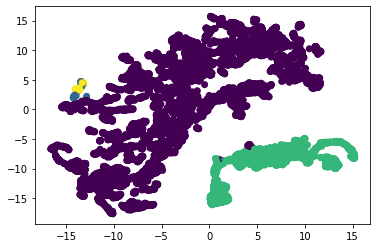



The Silhoutte score with average linkage and 2 clusters: 0.056622110307216644


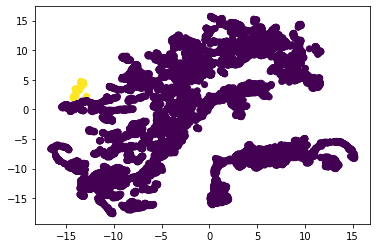



The Silhoutte score with average linkage and 3 clusters: 0.10210621356964111


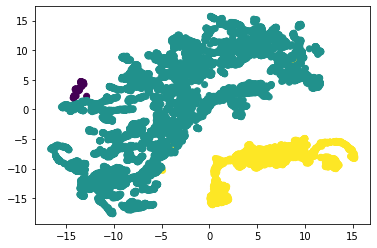



The Silhoutte score with average linkage and 4 clusters: 0.08262976258993149


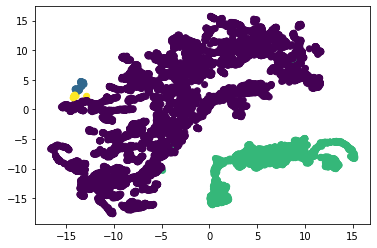



The greatest silhouette score is 0.3062230050563812.


In [40]:
umap_results = umap.UMAP(n_neighbors=250,
                      min_dist=0.5,
                      metric='correlation').fit_transform(X_all)

linkage = ['ward', 'complete', 'average']
numbers = [2, 3, 4]
silhouettes = []
for link in linkage:
    for cluster in numbers:
        agg_cluster = AgglomerativeClustering(linkage=link, 
                                      affinity='euclidean',
                                      n_clusters=cluster)
        clusters = agg_cluster.fit_predict(pca_components)
#         y_pred = 
        print('The Silhoutte score with', link,'linkage and', cluster, 'clusters: {}'.format(metrics.silhouette_score(umap_results, clusters, metric='euclidean')))
        plt.scatter(umap_results[:,0], umap_results[:,1], c=clusters)
        plt.show()
        silhouettes.append(metrics.silhouette_score(umap_results, clusters, metric='euclidean'))
        print('\n')
        
print('The greatest silhouette score is {}.'.format(max(silhouettes)))

## DBSCAN with PCA Components 

0.1 eps and 2 min samples.
The silhoutte score of the DBSCAN solution: 0.09425378942311949


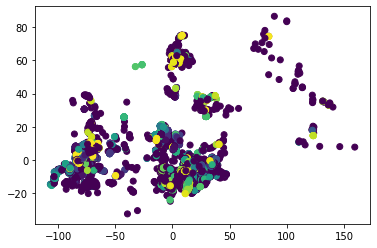



0.1 eps and 3 min samples.
The silhoutte score of the DBSCAN solution: 0.012830941728569035


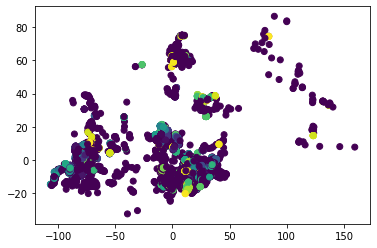



0.5 eps and 2 min samples.
The silhoutte score of the DBSCAN solution: 0.16602308500929067


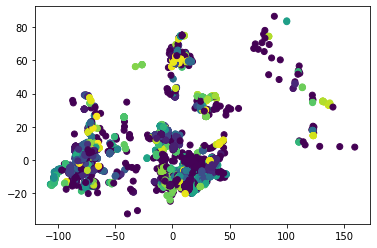



0.5 eps and 3 min samples.
The silhoutte score of the DBSCAN solution: 0.1364490533701171


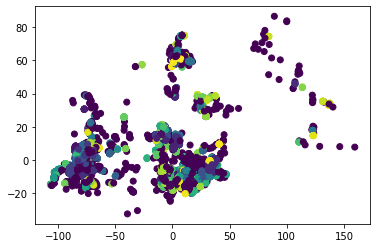



1 eps and 2 min samples.
The silhoutte score of the DBSCAN solution: -0.03680612172222467


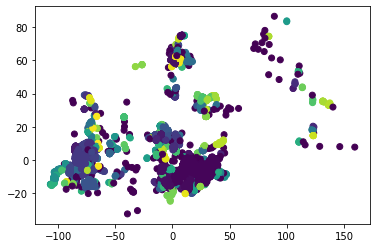



1 eps and 3 min samples.
The silhoutte score of the DBSCAN solution: 0.01191070556287226


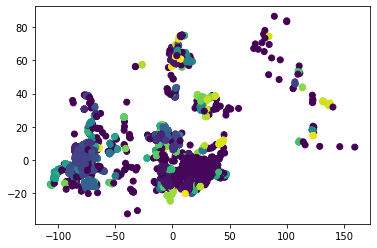



2 eps and 2 min samples.
The silhoutte score of the DBSCAN solution: -0.21203210798287458


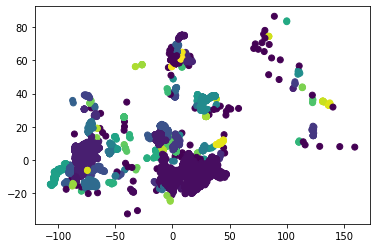



2 eps and 3 min samples.
The silhoutte score of the DBSCAN solution: -0.14425678779685613


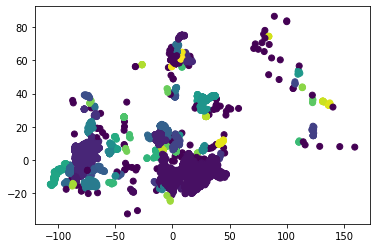



5 eps and 2 min samples.
The silhoutte score of the DBSCAN solution: 0.4361073429440801


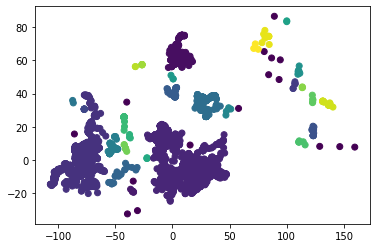



5 eps and 3 min samples.
The silhoutte score of the DBSCAN solution: 0.43528035692409023


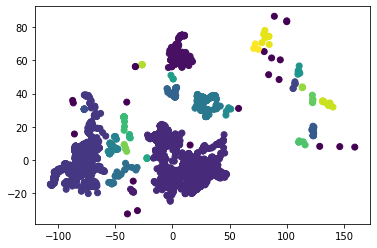



The greatest silhouette score is 0.4361073429440801.


In [33]:

silhouettes = []
eps = [0.1, 0.5, 1, 2, 5]
min_samples = [2, 3]

for ep in eps:
    for min_sample in min_samples:
        print(ep, 'eps and', min_sample, 'min samples.')
        dbscan_cluster = DBSCAN(eps=ep, min_samples=min_sample)
        clusters = dbscan_cluster.fit_predict(pca_components) 
        try: 
            print("The silhoutte score of the DBSCAN solution: {}".format(metrics.silhouette_score(pca_components, clusters, metric='euclidean')))
            silhouettes.append(metrics.silhouette_score(pca_components, clusters, metric='euclidean'))
            plt.scatter(pca_components[:,0], pca_components[:,1], c=clusters)
            plt.show()
            print('\n')
        except ValueError:
            print('\n')
            print('---------------------------------------------------')
            print('DBSCAN with', ep, 'eps and', min_sample, 'min samples was unable to find any clusters.')
            print('---------------------------------------------------')
            print('\n')
            
            
print('The greatest silhouette score is {}.'.format(max(silhouettes)))

## DBSCAN With UMAP

0.1 eps and 2 min samples.
The silhoutte score of the DBSCAN solution: 0.36663857102394104


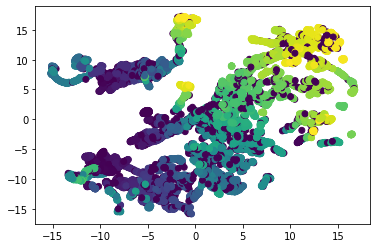



0.1 eps and 3 min samples.
The silhoutte score of the DBSCAN solution: 0.34969693422317505


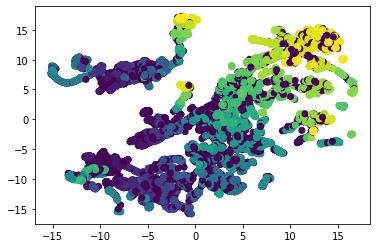



0.1 eps and 4 min samples.
The silhoutte score of the DBSCAN solution: 0.31901243329048157


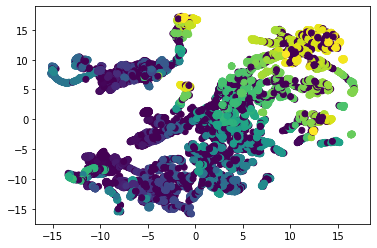



0.5 eps and 2 min samples.
The silhoutte score of the DBSCAN solution: -0.20521128177642822


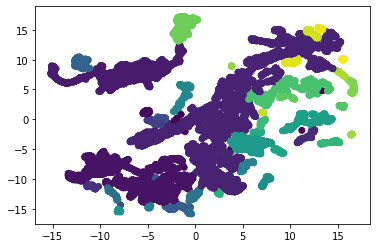



0.5 eps and 3 min samples.
The silhoutte score of the DBSCAN solution: -0.17374609410762787


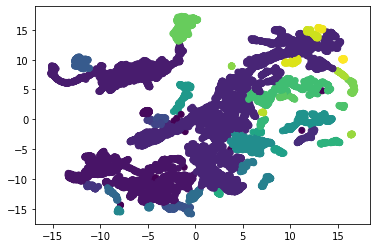



0.5 eps and 4 min samples.
The silhoutte score of the DBSCAN solution: -0.17374609410762787


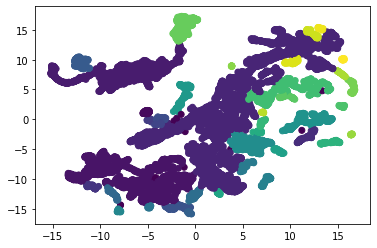



1 eps and 2 min samples.
The silhoutte score of the DBSCAN solution: -0.18226313591003418


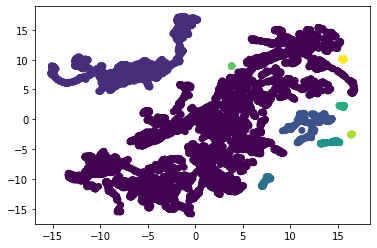



1 eps and 3 min samples.
The silhoutte score of the DBSCAN solution: -0.18226313591003418


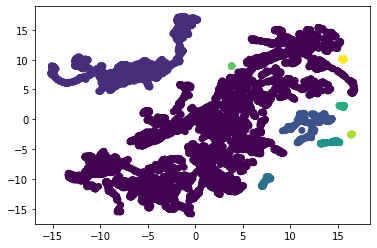



1 eps and 4 min samples.
The silhoutte score of the DBSCAN solution: -0.18226313591003418


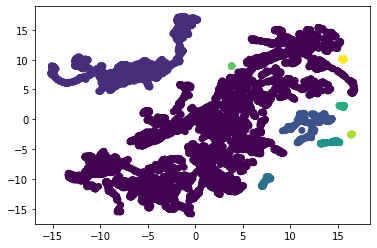



2 eps and 2 min samples.
The silhoutte score of the DBSCAN solution: 0.08262559026479721


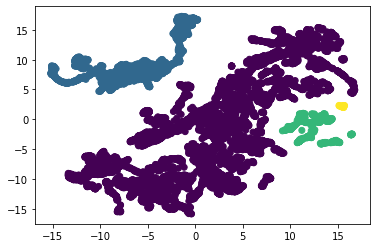



2 eps and 3 min samples.
The silhoutte score of the DBSCAN solution: 0.08262559026479721


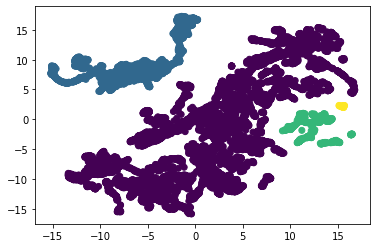



2 eps and 4 min samples.
The silhoutte score of the DBSCAN solution: 0.08262559026479721


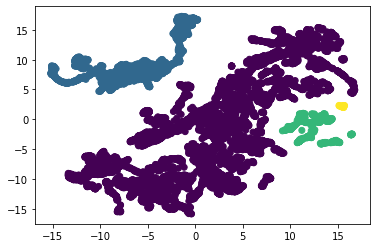



5 eps and 2 min samples.


---------------------------------------------------
DBSCAN with 5 eps and 2 min samples was unable to find any clusters.
---------------------------------------------------


5 eps and 3 min samples.


---------------------------------------------------
DBSCAN with 5 eps and 3 min samples was unable to find any clusters.
---------------------------------------------------


5 eps and 4 min samples.


---------------------------------------------------
DBSCAN with 5 eps and 4 min samples was unable to find any clusters.
---------------------------------------------------


The greatest silhouette score is 0.36663857102394104.


In [39]:
silhouettes = []
eps = [0.1, 0.5, 1, 2, 5]
min_samples = [2, 3, 4]

for ep in eps:
    for min_sample in min_samples:
        print(ep, 'eps and', min_sample, 'min samples.')
        dbscan_cluster = DBSCAN(eps=ep, min_samples=min_sample)
        clusters = dbscan_cluster.fit_predict(umap_results)
        try: 
            print("The silhoutte score of the DBSCAN solution: {}".format(metrics.silhouette_score(umap_results, clusters, metric='euclidean')))
            silhouettes.append(metrics.silhouette_score(umap_results, clusters, metric='euclidean'))
            plt.scatter(umap_results[:,0], umap_results[:,1], c=clusters)
            plt.show()
            print('\n')
        except ValueError:
            print('\n')
            print('---------------------------------------------------')
            print('DBSCAN with', ep, 'eps and', min_sample, 'min samples was unable to find any clusters.')
            print('---------------------------------------------------')
            print('\n')
            
print('The greatest silhouette score is {}.'.format(max(silhouettes)))

## GMM With PCA Components

GMM with full covariance type and 2 components.
The silhoutte score of the GMM solution: 0.7631136226622824


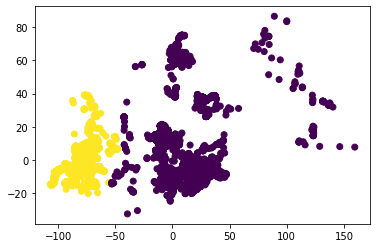



GMM with full covariance type and 4 components.
The silhoutte score of the GMM solution: 0.4253900534416047


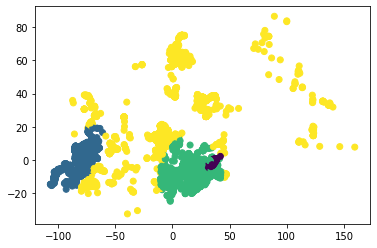



GMM with full covariance type and 6 components.
The silhoutte score of the GMM solution: 0.5642147470093801


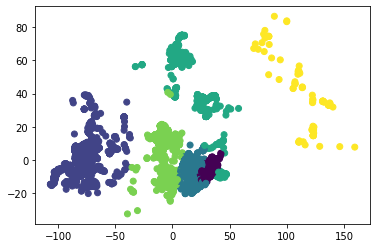



GMM with full covariance type and 8 components.
The silhoutte score of the GMM solution: 0.5415735064722045


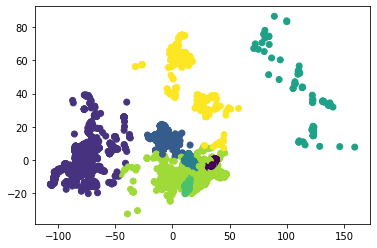



GMM with tied covariance type and 2 components.
The silhoutte score of the GMM solution: 0.7653019367401434


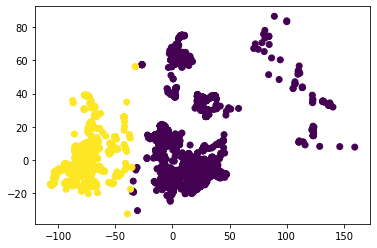



GMM with tied covariance type and 4 components.
The silhoutte score of the GMM solution: 0.682003265014224


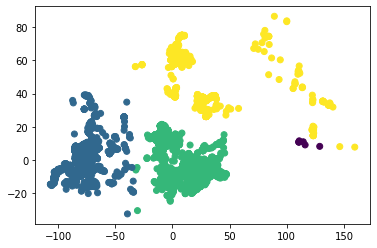



GMM with tied covariance type and 6 components.
The silhoutte score of the GMM solution: 0.5728784109910622


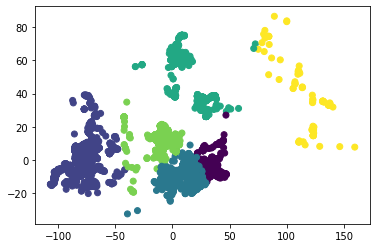



GMM with tied covariance type and 8 components.
The silhoutte score of the GMM solution: 0.6015170721141778


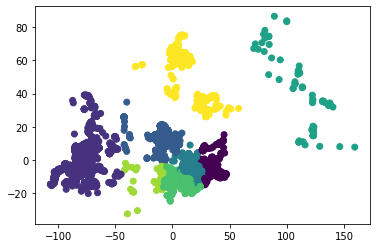



GMM with diag covariance type and 2 components.
The silhoutte score of the GMM solution: 0.76410989499678


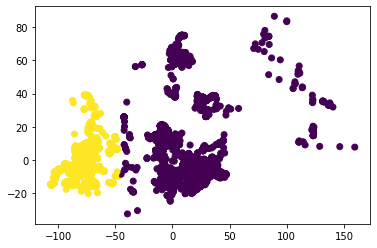



GMM with diag covariance type and 4 components.
The silhoutte score of the GMM solution: 0.36955468721942997


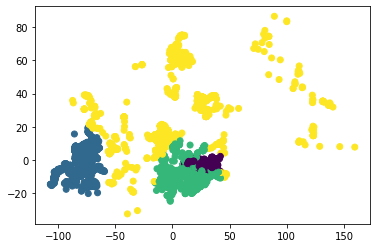



GMM with diag covariance type and 6 components.
The silhoutte score of the GMM solution: 0.5396352958348903


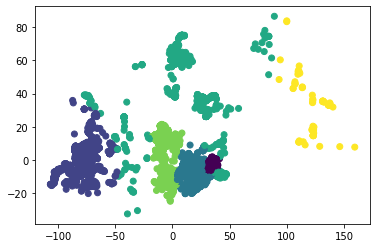



GMM with diag covariance type and 8 components.
The silhoutte score of the GMM solution: 0.5247554177134818


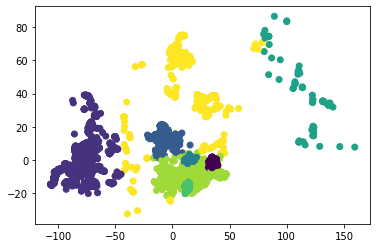



GMM with spherical covariance type and 2 components.
The silhoutte score of the GMM solution: 0.7640564767313022


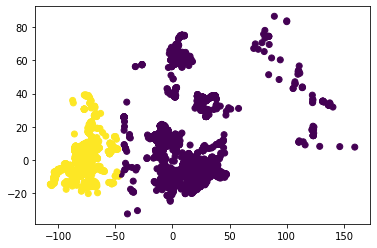



GMM with spherical covariance type and 4 components.
The silhoutte score of the GMM solution: 0.46183481222300415


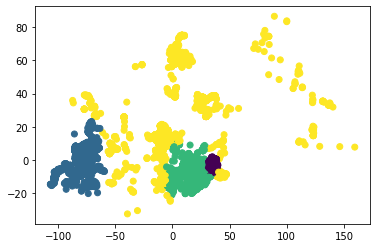



GMM with spherical covariance type and 6 components.
The silhoutte score of the GMM solution: 0.5467057017101205


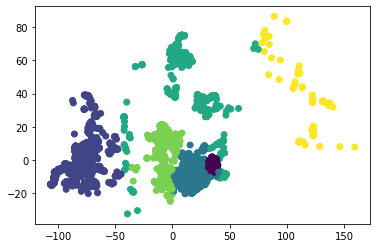



GMM with spherical covariance type and 8 components.
The silhoutte score of the GMM solution: 0.5850045279705476


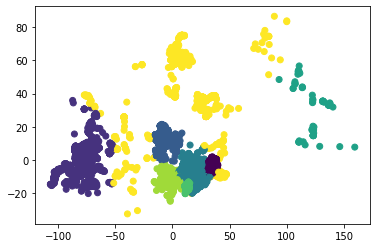



The greatest silhouette score is 0.7653019367401434.


In [35]:
silhouettes = []
covariance_types = ['full', 'tied', 'diag', 'spherical']
n_components = [2, 4, 6, 8]

for c_type in covariance_types:
    for n in n_components:
        gmm_cluster = GaussianMixture(n_components=n, random_state=123, 
                                     covariance_type=c_type)
        clusters = gmm_cluster.fit_predict(pca_components)
        print('GMM with', c_type, 'covariance type and', n, 'components.')
        print("The silhoutte score of the GMM solution: {}".format(metrics.silhouette_score(pca_components, clusters, metric='euclidean')))
        silhouettes.append(metrics.silhouette_score(pca_components, clusters, metric='euclidean'))
        plt.scatter(pca_components[:,0], pca_components[:,1], c=clusters)
        plt.show()
        print('\n')
        
        
print('The greatest silhouette score is {}.'.format(max(silhouettes)))

## GMM with UMAP

GMM with full covariance type and 2 components.
The silhoutte score of the GMM solution: 0.4024505913257599


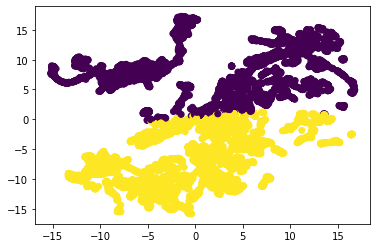



GMM with full covariance type and 3 components.
The silhoutte score of the GMM solution: 0.46771878004074097


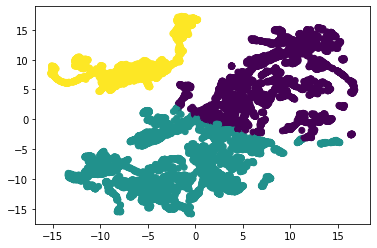



GMM with full covariance type and 4 components.
The silhoutte score of the GMM solution: 0.42993175983428955


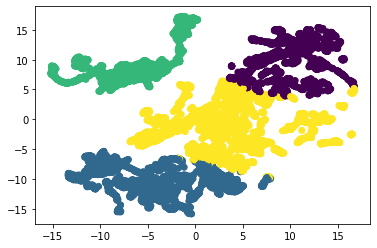



GMM with tied covariance type and 2 components.
The silhoutte score of the GMM solution: 0.39471200108528137


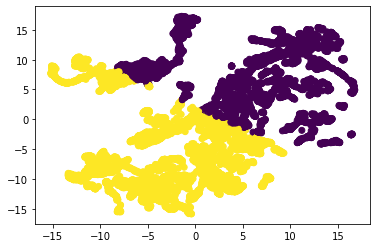



GMM with tied covariance type and 3 components.
The silhoutte score of the GMM solution: 0.47373032569885254


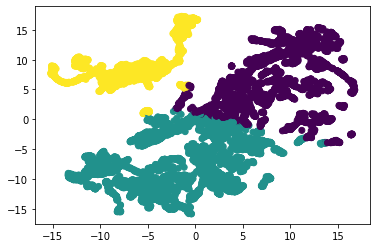



GMM with tied covariance type and 4 components.
The silhoutte score of the GMM solution: 0.43821293115615845


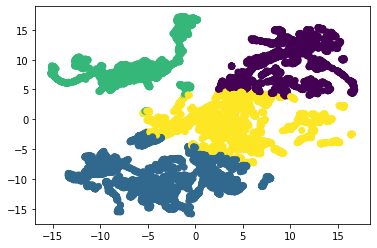



GMM with diag covariance type and 2 components.
The silhoutte score of the GMM solution: 0.40359869599342346


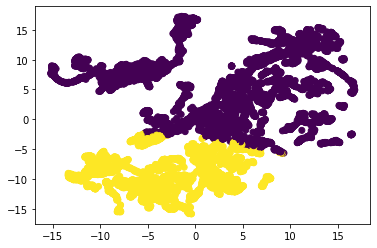



GMM with diag covariance type and 3 components.
The silhoutte score of the GMM solution: 0.4769498407840729


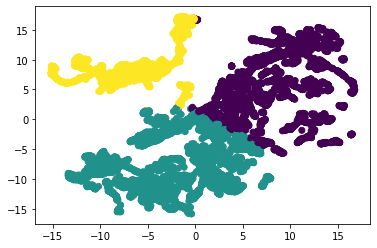



GMM with diag covariance type and 4 components.
The silhoutte score of the GMM solution: 0.4345618188381195


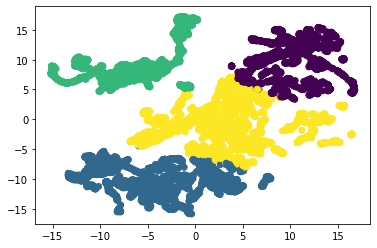



GMM with spherical covariance type and 2 components.
The silhoutte score of the GMM solution: 0.39486831426620483


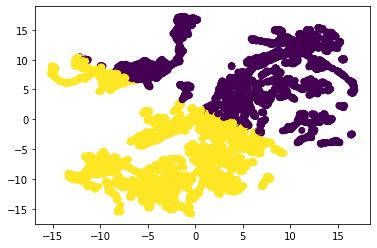



GMM with spherical covariance type and 3 components.
The silhoutte score of the GMM solution: 0.4708309471607208


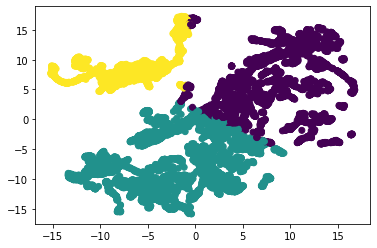



GMM with spherical covariance type and 4 components.
The silhoutte score of the GMM solution: 0.44742849469184875


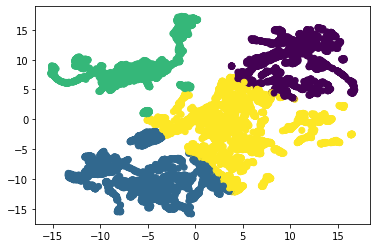



The greatest silhouette score is 0.4769498407840729.


In [38]:
silhouettes = []
covariance_types = ['full', 'tied', 'diag', 'spherical']
n_components = [2, 3, 4]

for c_type in covariance_types:
    for n in n_components:
        gmm_cluster = GaussianMixture(n_components=n, random_state=123, 
                                     covariance_type=c_type)
        clusters = gmm_cluster.fit_predict(umap_results)
        print('GMM with', c_type, 'covariance type and', n, 'components.')
        print("The silhoutte score of the GMM solution: {}".format(metrics.silhouette_score(umap_results, clusters, metric='euclidean')))
        silhouettes.append(metrics.silhouette_score(umap_results, clusters, metric='euclidean'))
        plt.scatter(umap_results[:,0], umap_results[:,1], c=clusters)
        plt.show()
        print('\n')
        
print('The greatest silhouette score is {}.'.format(max(silhouettes)))

In [37]:
print(silhouettes)

[0.2389757046596071, 0.13861990765488535, 0.11399873887651056, -0.0775588669722165, 0.05261414081572756, 0.15915041900950497, 0.14095555842770388, -0.09253517519182018, 0.04742101082042384, 0.14254185729837013, 0.08722610707068036, -0.07423207162294544, 0.06308091713722512, 0.11371808641504058, 0.09000811603219577, -0.0837221801524133]


In [ ]:
bar graph of each feature with the average in each cluster
group by cluster